# 1) FCN on Adiac

In [ ]:
# %load FCN.py
#!/usr/bin/env python2
"""
Created on Sun Oct 30 20:11:19 2016

@author: stephen
"""

from __future__ import print_function

from tensorflow import keras
import numpy as np
import pandas as pd

def readucr(filename):
    data = np.loadtxt(filename, delimiter = ',')
    Y = data[:,0]
    X = data[:,1:]
    return X, Y

nb_epochs = 5


#flist = ['Adiac', 'Beef', 'CBF', 'ChlorineConcentration', 'CinC_ECG_torso', 'Coffee', 'Cricket_X', 'Cricket_Y', 'Cricket_Z',
#'DiatomSizeReduction', 'ECGFiveDays', 'FaceAll', 'FaceFour', 'FacesUCR', '50words', 'FISH', 'Gun_Point', 'Haptics',
#'InlineSkate', 'ItalyPowerDemand', 'Lighting2', 'Lighting7', 'MALLAT', 'MedicalImages', 'MoteStrain', 'NonInvasiveFatalECG_Thorax1',
#'NonInvasiveFatalECG_Thorax2', 'OliveOil', 'OSULeaf', 'SonyAIBORobotSurface', 'SonyAIBORobotSurfaceII', 'StarLightCurves', 'SwedishLeaf', 'Symbols',
#'synthetic_control', 'Trace', 'TwoLeadECG', 'Two_Patterns', 'uWaveGestureLibrary_X', 'uWaveGestureLibrary_Y', 'uWaveGestureLibrary_Z', 'wafer', 'WordsSynonyms', 'yoga']

flist  = ['Adiac']
for each in flist:
    fname = each
    x_train, y_train = readucr(fname+'/'+fname+'_TRAIN')
    x_test, y_test = readucr(fname+'/'+fname+'_TEST')
    nb_classes = len(np.unique(y_test))
    batch_size = min(x_train.shape[0]/10, 16)

    y_train = (y_train - y_train.min())/(y_train.max()-y_train.min())*(nb_classes-1)
    y_test = (y_test - y_test.min())/(y_test.max()-y_test.min())*(nb_classes-1)


    Y_train = keras.utils.to_categorical(y_train, nb_classes)
    Y_test = keras.utils.to_categorical(y_test, nb_classes)

    x_train_mean = x_train.mean()
    x_train_std = x_train.std()
    x_train = (x_train - x_train_mean)/(x_train_std)

    x_test = (x_test - x_train_mean)/(x_train_std)
    x_train = x_train.reshape(x_train.shape + (1,1,))
    x_test = x_test.reshape(x_test.shape + (1,1,))

    x = keras.layers.Input(x_train.shape[1:])
#    drop_out = Dropout(0.2)(x)
    conv1 = keras.layers.Conv2D(128, 8, 1, padding='same')(x)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.Activation('relu')(conv1)

#    drop_out = Dropout(0.2)(conv1)
    conv2 = keras.layers.Conv2D(256, 5, 1, padding='same')(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.Activation('relu')(conv2)

#    drop_out = Dropout(0.2)(conv2)
    conv3 = keras.layers.Conv2D(128, 3, 1, padding='same')(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.Activation('relu')(conv3)

    full = keras.layers.GlobalAveragePooling2D()(conv3)
    out = keras.layers.Dense(nb_classes, activation='softmax')(full)


    model = keras.models.Model(inputs=x, outputs=out)

    optimizer = keras.optimizers.Adam()
    model.compile(loss='categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])

    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor = 'loss', factor=0.5,
                      patience=50, min_lr=0.0001)
    hist = model.fit(x_train, Y_train, batch_size=batch_size, epochs=nb_epochs,
              verbose=1, validation_data=(x_test, Y_test), callbacks = [reduce_lr])
    #Print the testing results which has the lowest training loss.
    log = pd.DataFrame(hist.history)
    print(log.loc[log['loss'].idxmin()]['loss'], log.loc[log['loss'].idxmin()]['val_accuracy'])


############## Get CAM ################
import matplotlib.pyplot as plt
# from matplotlib.backends.backend_pdf import PdfPages

get_last_conv = keras.backend.function([model.layers[0].input, keras.backend.learning_phase()], [model.layers[-3].output])
last_conv = get_last_conv([x_test[:100], 1])[0]

get_softmax = keras.backend.function([model.layers[0].input, keras.backend.learning_phase()], [model.layers[-1].output])
softmax = get_softmax(([x_test[:100], 1]))[0]
softmax_weight = model.get_weights()[-2]
CAM = np.dot(last_conv, softmax_weight)


# pp = PdfPages('CAM.pdf')
for k in range(20):
    CAM = (CAM - CAM.min(axis=1, keepdims=True)) / (CAM.max(axis=1, keepdims=True) - CAM.min(axis=1, keepdims=True))
    c = np.exp(CAM) / np.sum(np.exp(CAM), axis=1, keepdims=True)
    plt.figure(figsize=(13, 7));
    plt.plot(x_test[k].squeeze());
    plt.scatter(np.arange(len(x_test[k])), x_test[k].squeeze(), cmap='hot_r', c=c[k, :, :, int(y_test[k])].squeeze(), s=100);
    plt.title(
        'True label:' + str(y_test[k]) + '   likelihood of label ' + str(y_test[k]) + ': ' + str(softmax[k][int(y_test[k])]))
    plt.colorbar();
#     pp.savefig()
#
# pp.close()

Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - accuracy: 0.0282 - loss: 3.6665 - val_accuracy: 0.0230 - val_loss: 3.6232 - learning_rate: 0.0010
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.0872 - loss: 3.4745 - val_accuracy: 0.0281 - val_loss: 3.7384 - learning_rate: 0.0010
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - accuracy: 0.1282 - loss: 3.3195 - val_accuracy: 0.0281 - val_loss: 4.7878 - learning_rate: 0.0010
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.1564 - loss: 3.1567 - val_accuracy: 0.0281 - val_loss: 8.2513 - learning_rate: 0.0010
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.1821 - loss: 3.0593 - val_accuracy: 0.0281 - val_loss: 12.4799 - learning_rate: 0.0010
3.0593044757843018 0.02813299186527729


AttributeError: module 'keras._tf_keras.keras.backend' has no attribute 'function'

# 1a) Debugged FCN on Adiac dataset

Epoch 1/2000
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - accuracy: 0.0333 - loss: 3.6978 - val_accuracy: 0.0281 - val_loss: 3.6142 - learning_rate: 0.0010
Epoch 2/2000
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - accuracy: 0.0897 - loss: 3.5387 - val_accuracy: 0.0281 - val_loss: 3.6416 - learning_rate: 0.0010
Epoch 3/2000
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - accuracy: 0.1051 - loss: 3.3943 - val_accuracy: 0.0281 - val_loss: 3.9931 - learning_rate: 0.0010
Epoch 4/2000
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - accuracy: 0.1308 - loss: 3.2631 - val_accuracy: 0.0281 - val_loss: 5.8799 - learning_rate: 0.0010
Epoch 5/2000
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - accuracy: 0.1974 - loss: 3.1223 - val_accuracy: 0.0281 - val_loss: 9.3864 - learning_rate: 0.0010
Epoch 6/2000
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.1974 - loss: 3.0015 - val_accuracy: 0.0281 - val_loss: 14.2399 - learning_rate: 0.0010
Epoch 7/2000
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.2462 - loss: 2

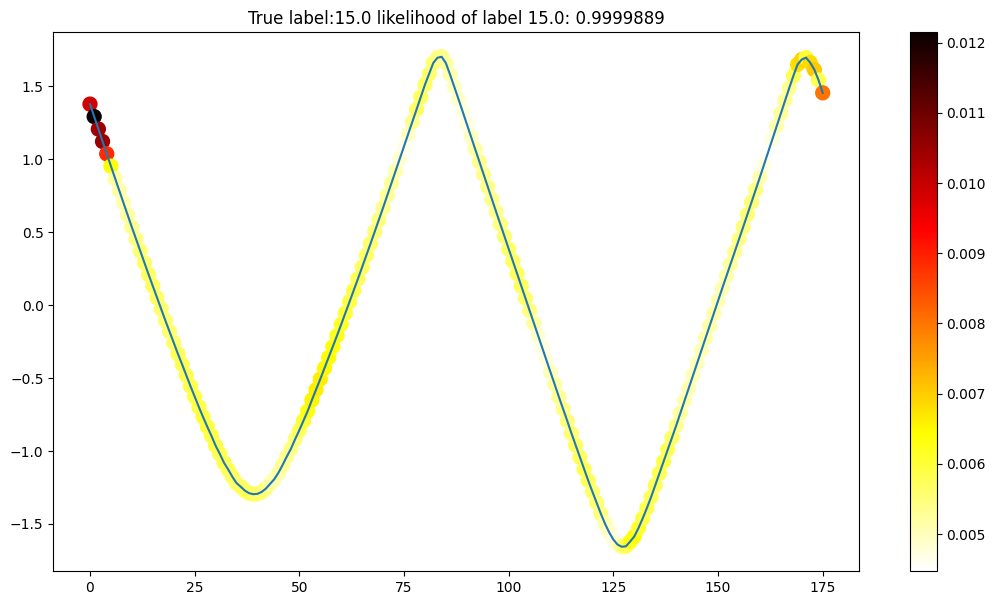

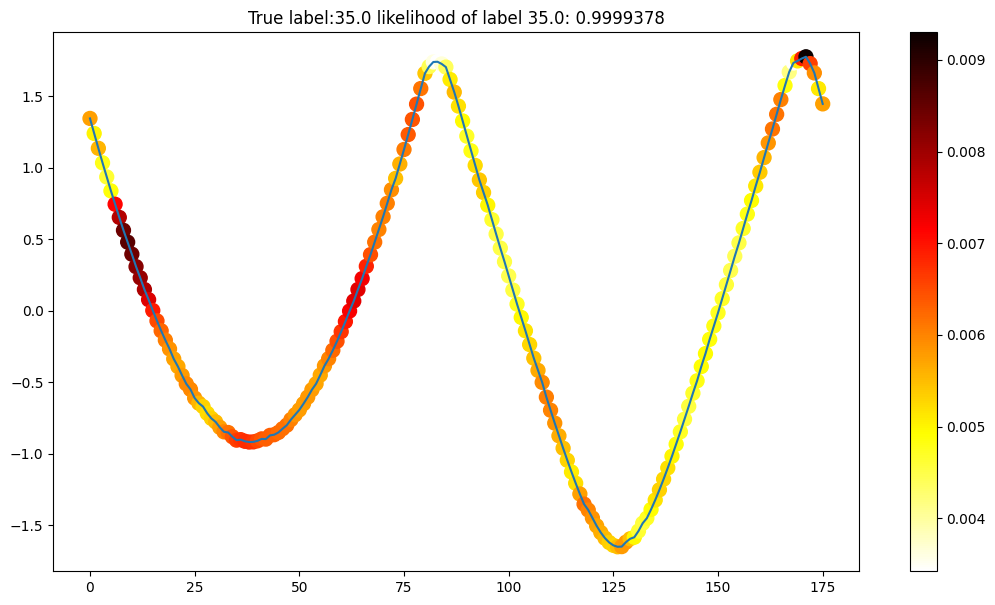

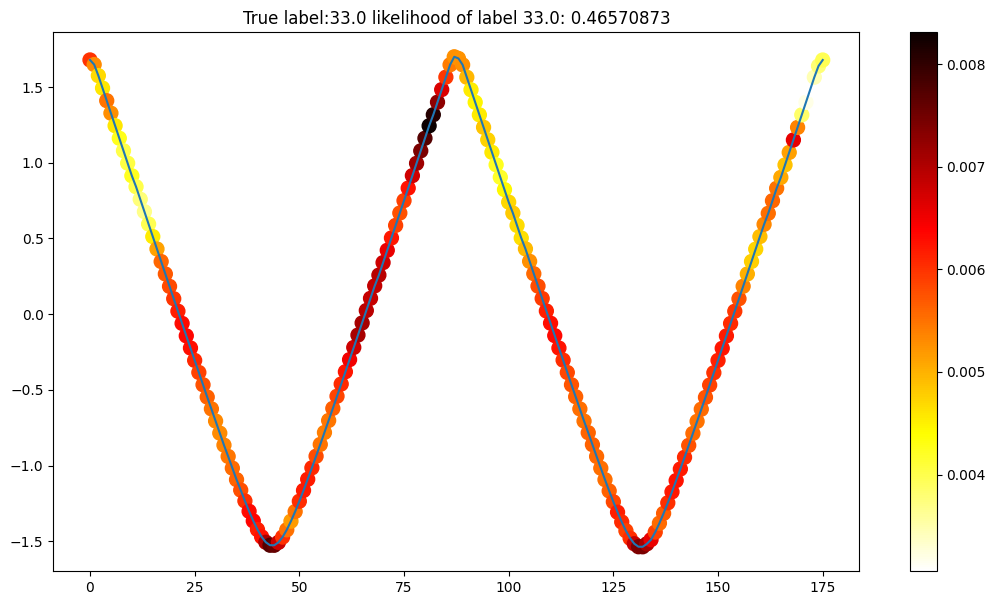

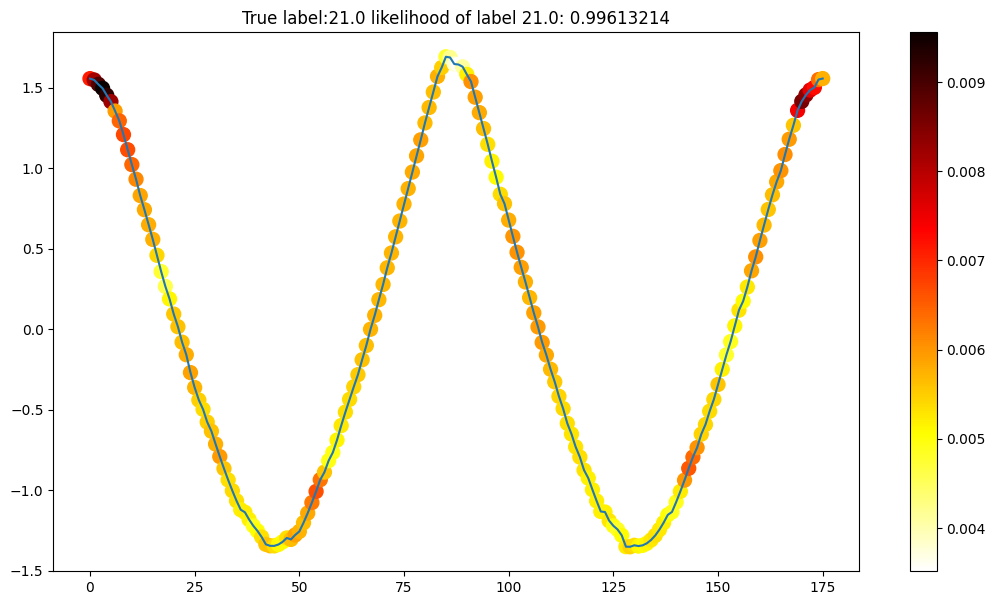

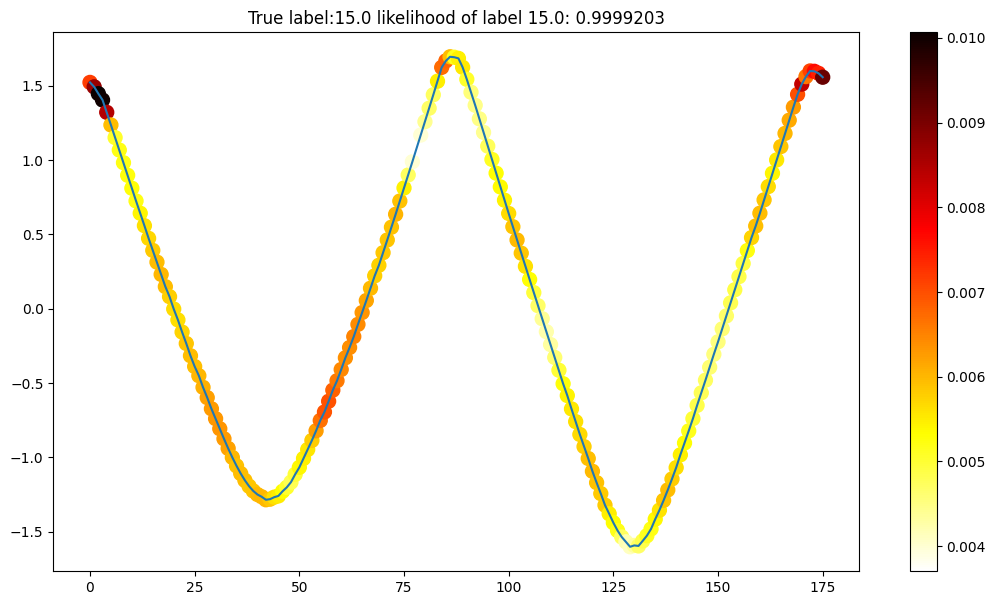

...

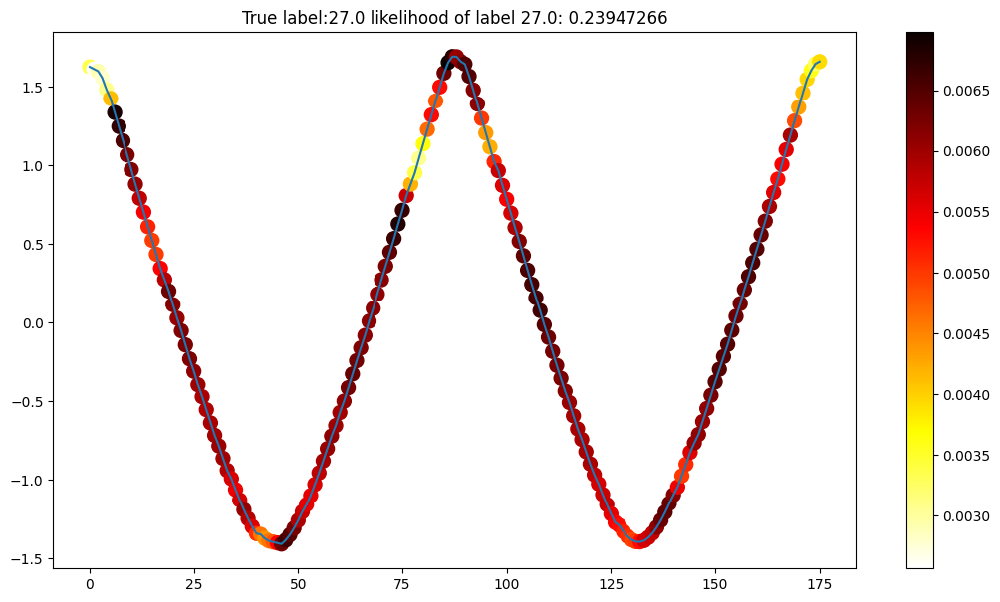

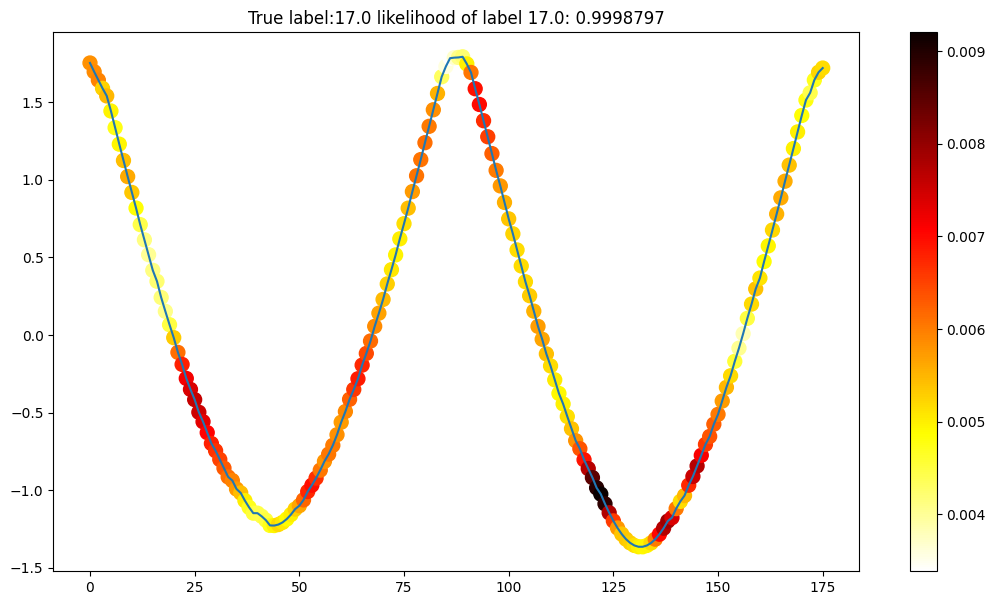

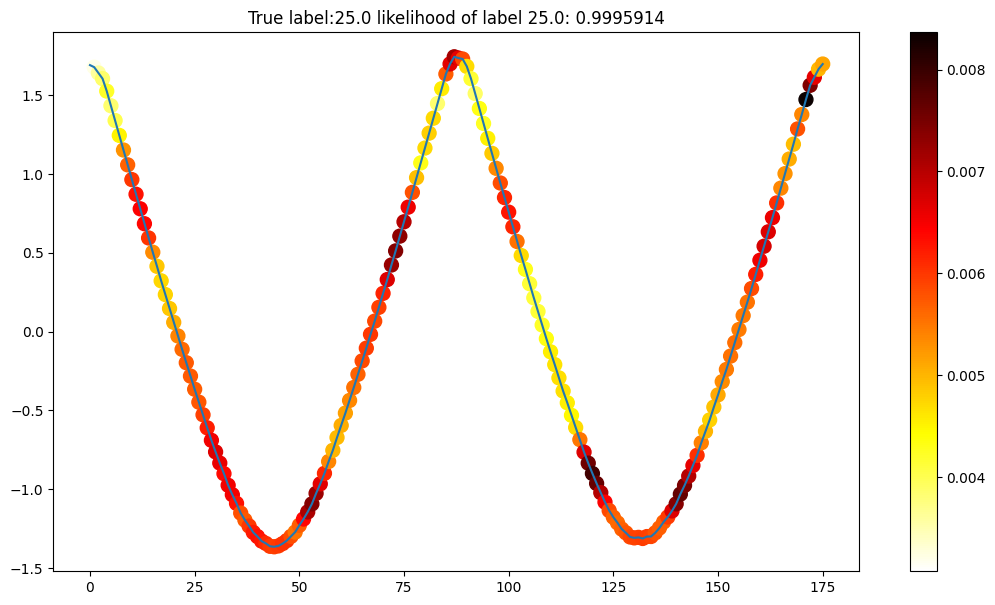

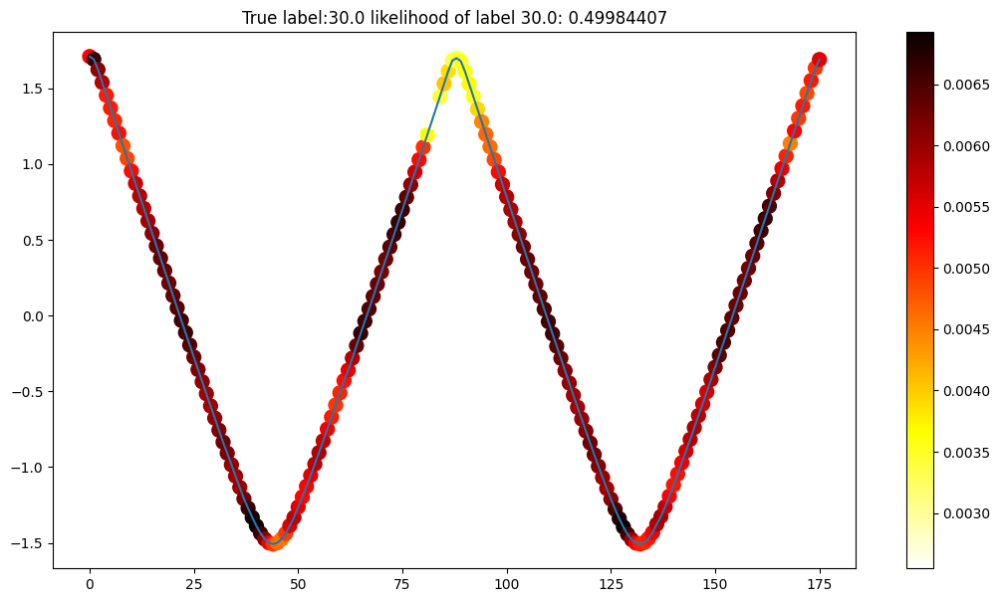

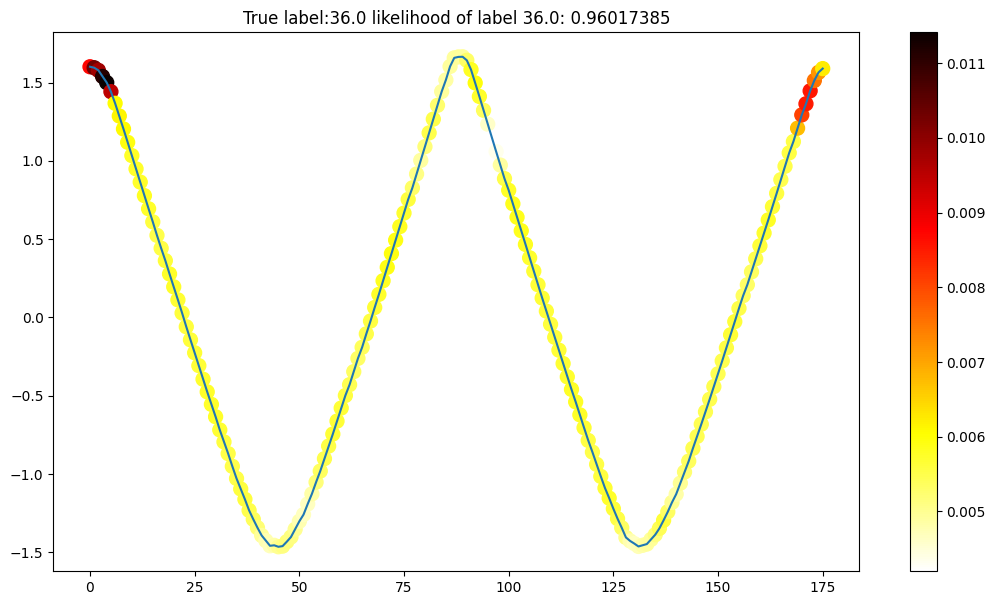

In [ ]:
#!/usr/bin/env python3
"""
Created on Sun Oct 30 20:11:19 2016
@author: stephen
Fixed for modern TensorFlow/Keras (TF2.x)
"""
from tensorflow import keras
from tensorflow.keras.models import Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def readucr(filename):
    data = np.loadtxt(filename, delimiter=',')
    Y = data[:, 0]
    X = data[:, 1:]
    return X, Y

nb_epochs = 2000
flist = ['Adiac']
for each in flist:
    fname = each
    x_train, y_train = readucr(fname + '/' + fname + '_TRAIN')
    x_test, y_test = readucr(fname + '/' + fname + '_TEST')
    nb_classes = len(np.unique(y_test))
    batch_size = min(x_train.shape[0] / 10, 16)

    y_train = (y_train - y_train.min()) / (y_train.max() - y_train.min()) * (nb_classes - 1)
    y_test = (y_test - y_test.min()) / (y_test.max() - y_test.min()) * (nb_classes - 1)

    Y_train = keras.utils.to_categorical(y_train, nb_classes)
    Y_test = keras.utils.to_categorical(y_test, nb_classes)

    x_train_mean = x_train.mean()
    x_train_std = x_train.std()
    x_train = (x_train - x_train_mean) / (x_train_std)

    x_test = (x_test - x_train_mean) / (x_train_std)
    x_train = x_train.reshape(x_train.shape + (1, 1,))
    x_test = x_test.reshape(x_test.shape + (1, 1,))
    x = keras.layers.Input(x_train.shape[1:])
    conv1 = keras.layers.Conv2D(128, 8, 1, padding='same')(x)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.Activation('relu')(conv1)

    conv2 = keras.layers.Conv2D(256, 5, 1, padding='same')(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.Activation('relu')(conv2)

    conv3 = keras.layers.Conv2D(128, 3, 1, padding='same')(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.Activation('relu')(conv3)

    full = keras.layers.GlobalAveragePooling2D()(conv3)
    out = keras.layers.Dense(nb_classes, activation='softmax')(full)

    model = keras.models.Model(inputs=x, outputs=out)

    optimizer = keras.optimizers.Adam()
    model.compile(loss='categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])

    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                                                  patience=50, min_lr=0.0001)
    hist = model.fit(x_train, Y_train, batch_size=batch_size, epochs=nb_epochs,
                     verbose=1, validation_data=(x_test, Y_test), callbacks=[reduce_lr])
    # Print the testing results which has the lowest training loss.
    log = pd.DataFrame(hist.history)
    print(log.loc[log['loss'].idxmin()]['loss'], log.loc[log['loss'].idxmin()]['val_accuracy'])

############## Get CAM ################
# Create submodels for intermediate outputs (replaces deprecated K.function)
last_conv_model = Model(inputs=model.inputs, outputs=model.layers[-3].output)
softmax_model = Model(inputs=model.inputs, outputs=model.layers[-1].output)

# Get outputs in inference mode
last_conv = last_conv_model.predict(x_test[:100])
softmax = softmax_model.predict(x_test[:100])

# Alternatively, to match original learning_phase=1 (training mode):
# last_conv = last_conv_model(x_test[:100], training=True).numpy()
# softmax = softmax_model(x_test[:100], training=True).numpy()

softmax_weight = model.get_weights()[-2]
CAM = np.dot(last_conv, softmax_weight)

for k in range(20):
    CAM_k = (CAM - CAM.min(axis=1, keepdims=True)) / (CAM.max(axis=1, keepdims=True) - CAM.min(axis=1, keepdims=True) + 1e-7)  # Added epsilon for stability
    c = np.exp(CAM_k) / np.sum(np.exp(CAM_k), axis=1, keepdims=True)
    plt.figure(figsize=(13, 7))
    plt.plot(x_test[k].squeeze())
    plt.scatter(np.arange(len(x_test[k])), x_test[k].squeeze(), cmap='hot_r', c=c[k, :, :, int(y_test[k])].squeeze(), s=100)
    plt.title('True label:' + str(y_test[k]) + ' likelihood of label ' + str(y_test[k]) + ': ' + str(softmax[k][int(y_test[k])]))
    plt.colorbar()
    plt.show()  # Use plt.show() instead of saving to PDF for notebook display

# 2) FCN on GunPoint dataset

Epoch 1/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6000 - loss: 0.7643 - val_accuracy: 0.4933 - val_loss: 0.6917 - learning_rate: 0.0010
Epoch 2/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.6800 - loss: 0.6148 - val_accuracy: 0.4933 - val_loss: 0.6894 - learning_rate: 0.0010
Epoch 3/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5000 - loss: 0.6428 - val_accuracy: 0.4933 - val_loss: 0.6940 - learning_rate: 0.0010
Epoch 4/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.4000 - loss: 0.6911 - val_accuracy: 0.4933 - val_loss: 0.6960 - learning_rate: 0.0010
Epoch 5/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.6000 - loss: 0.6604 - val_accuracy: 0.4933 - val_loss: 0.7085 - learning_rate: 0.0010
Epoch 6/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6200 - loss: 0.6197 - val_accuracy: 0.4933 - val_loss: 0.7035 - learning_rate: 0.0010
Epoch 7/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.6000 - loss: 0.

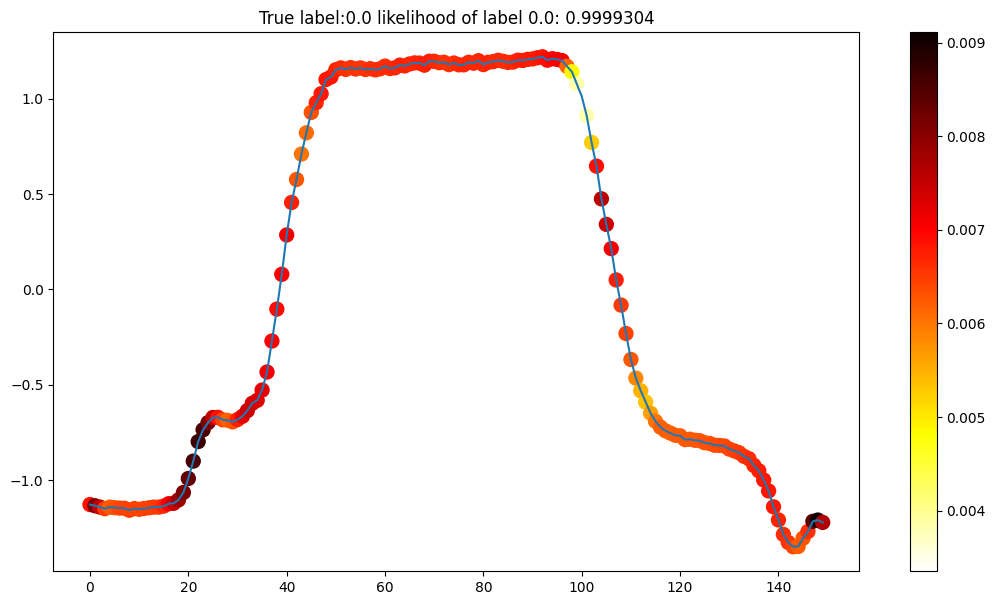

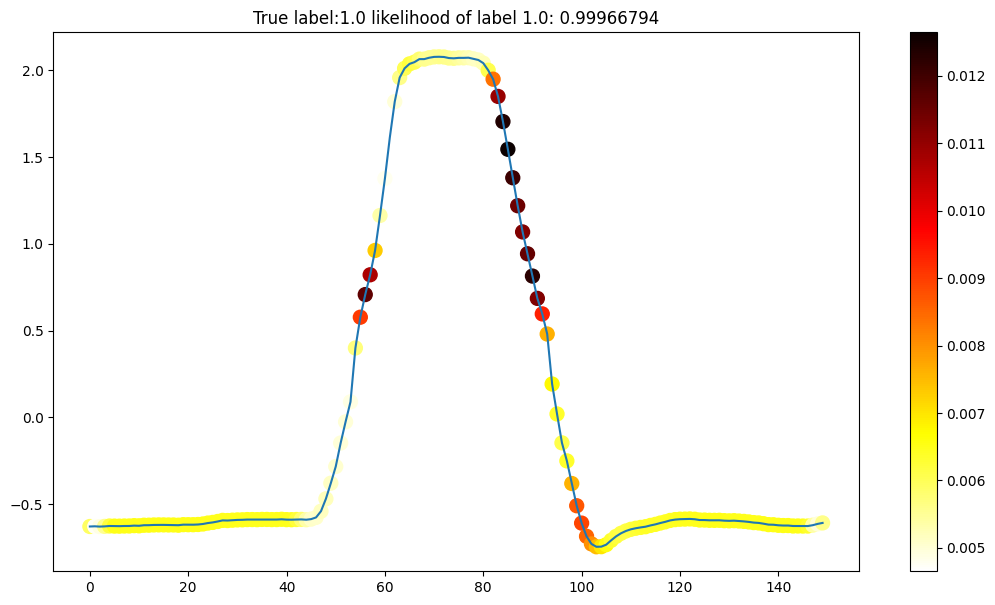

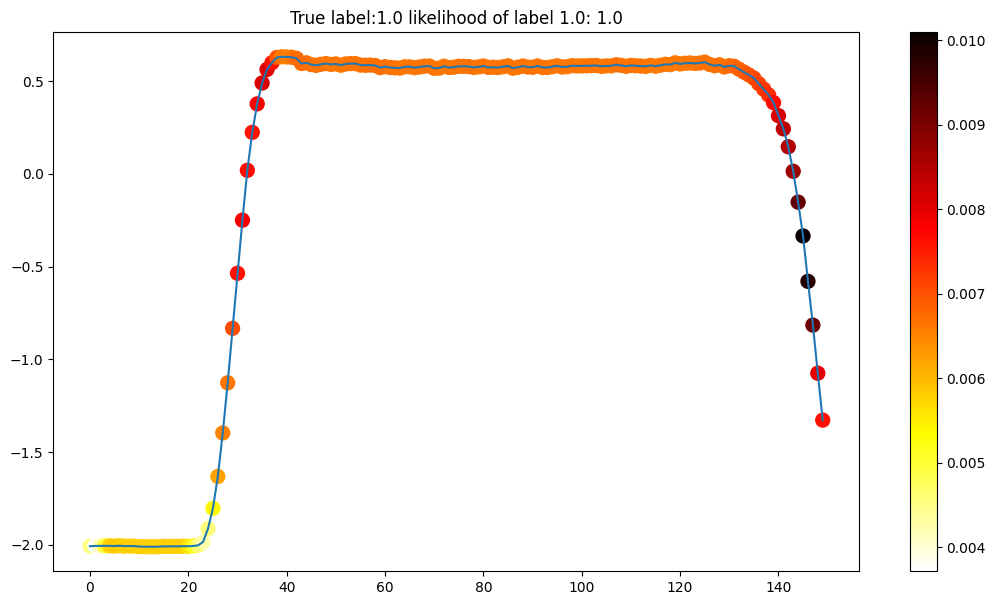

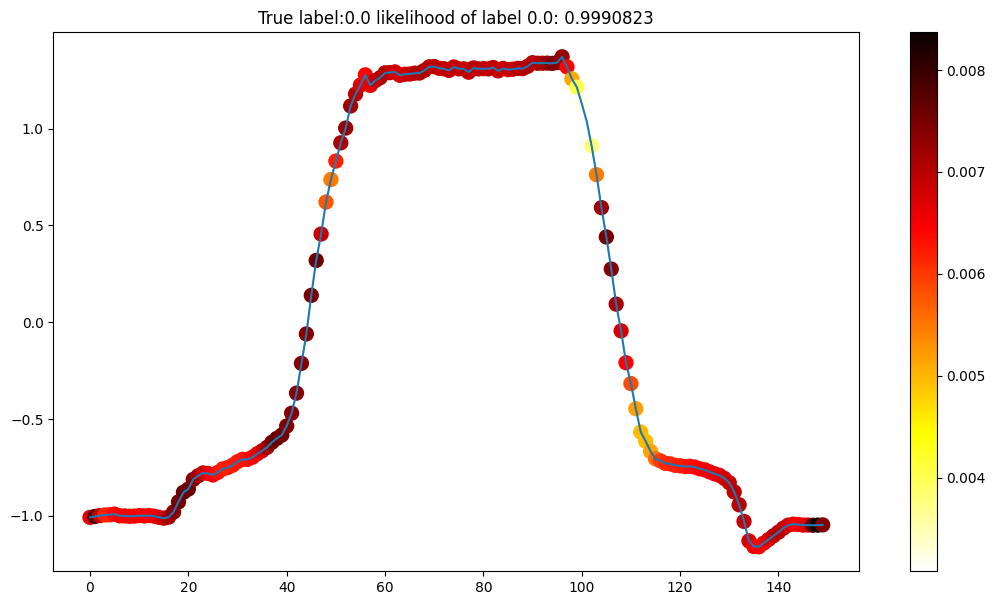

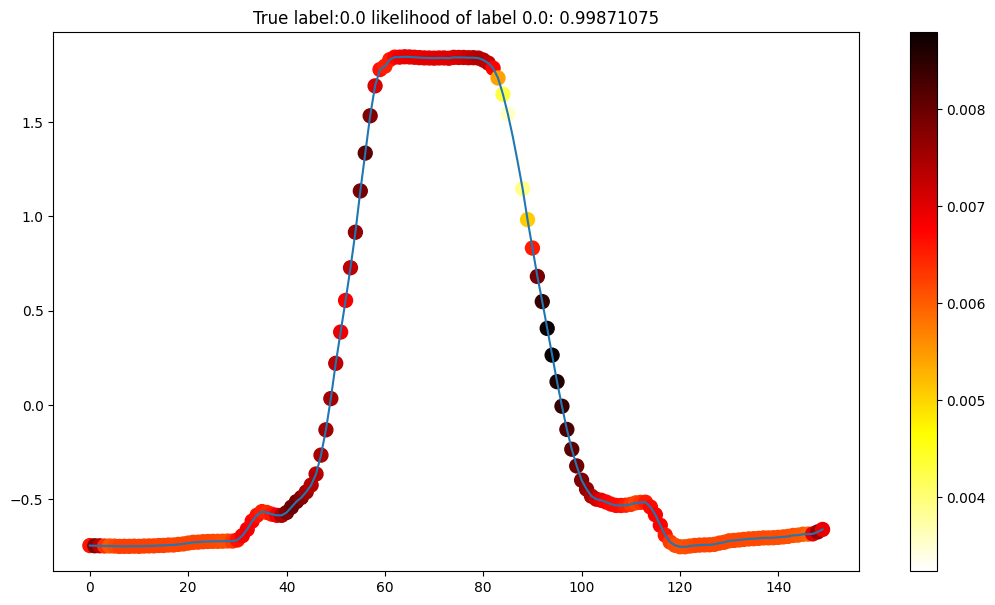

...

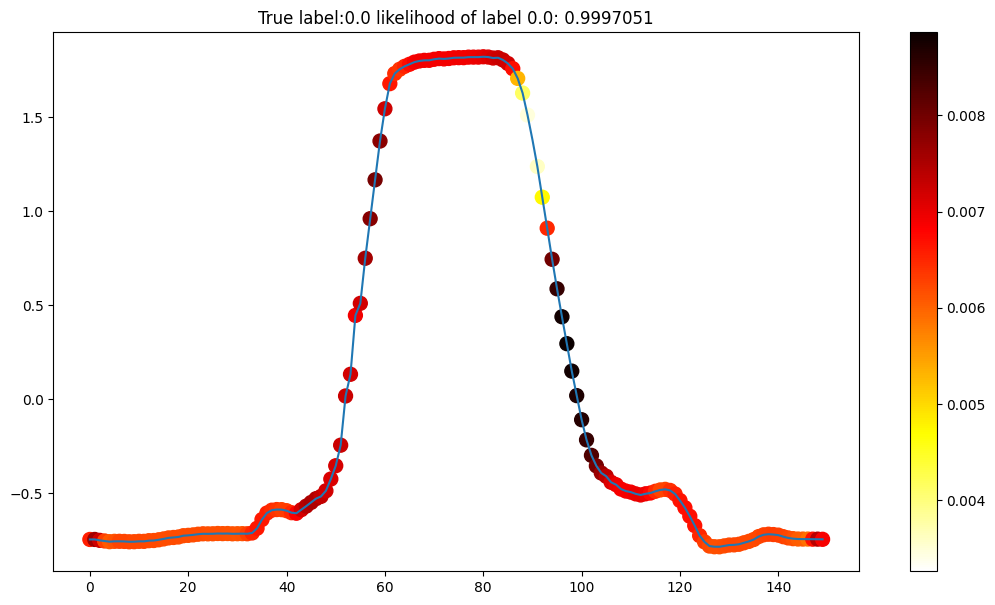

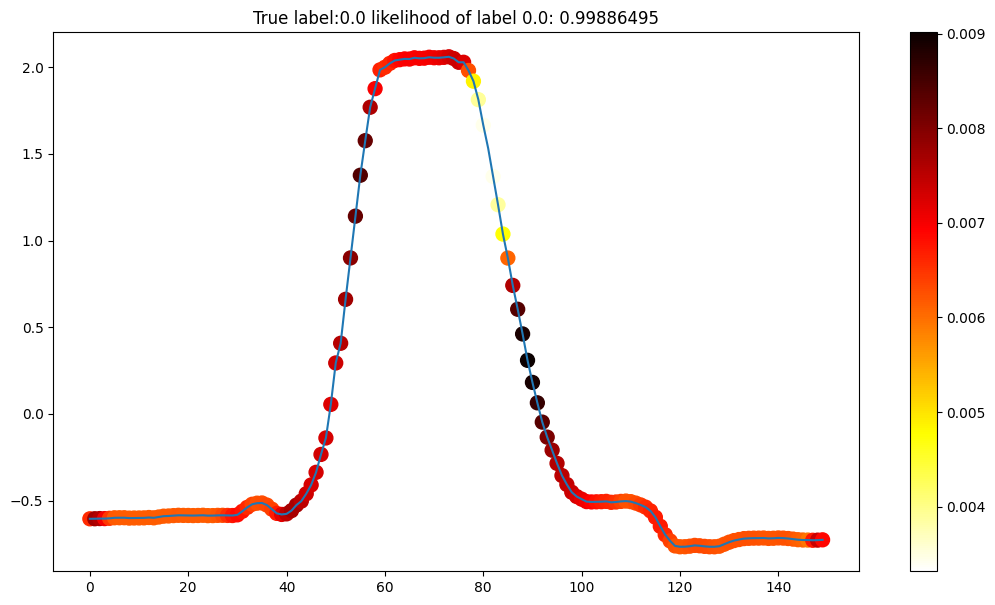

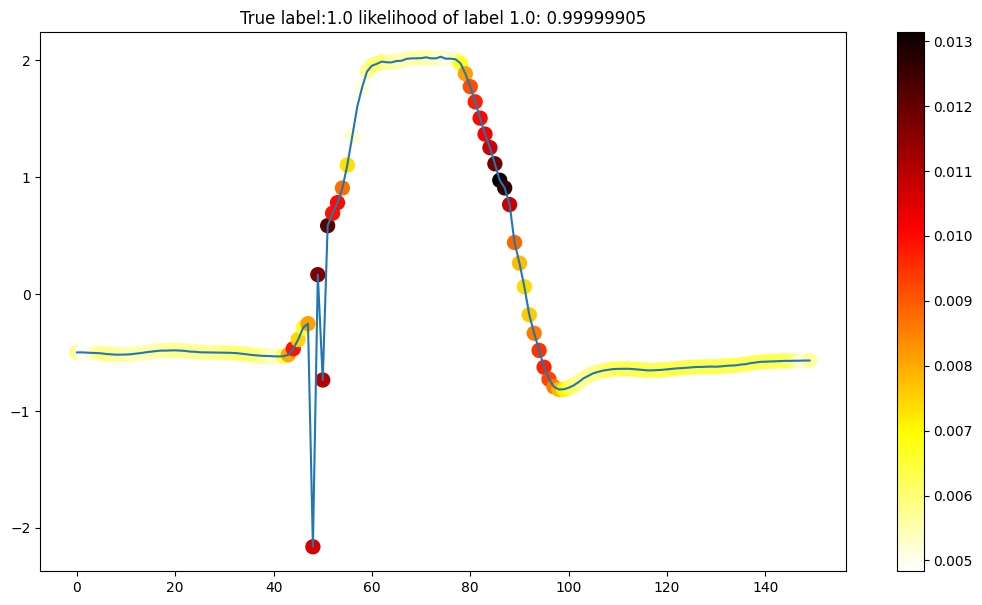

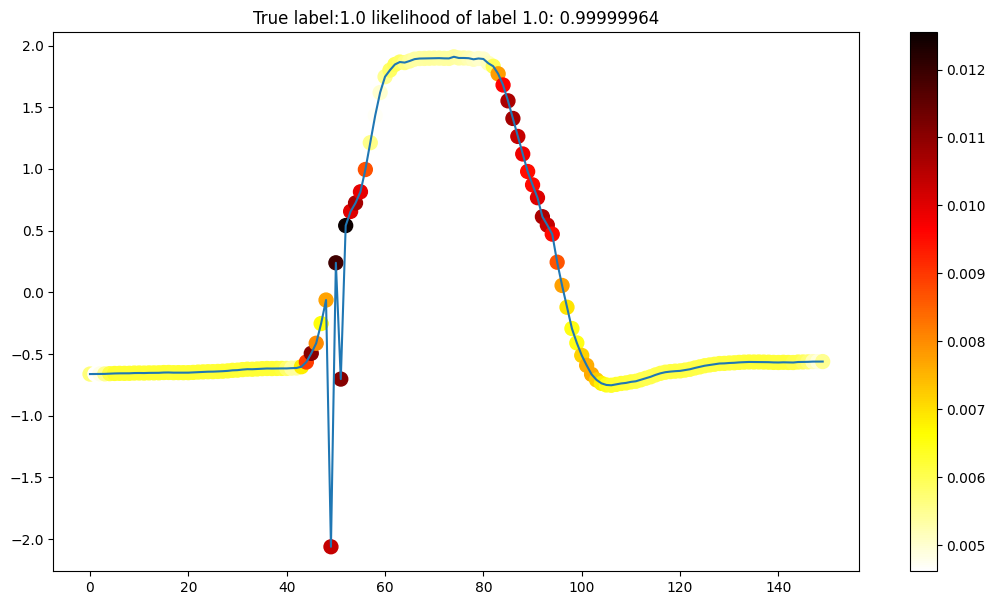

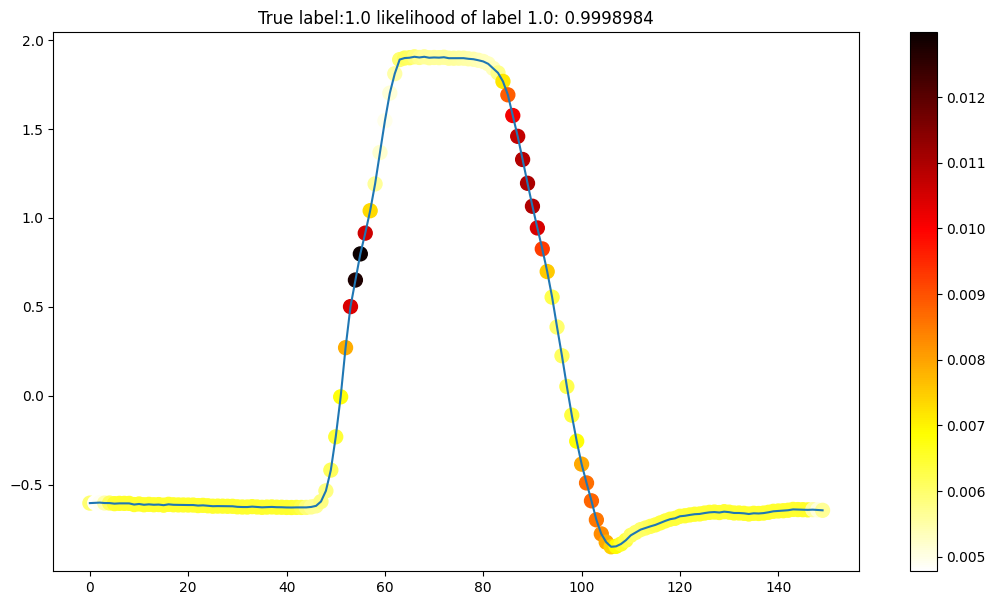

In [ ]:
#!/usr/bin/env python3
"""
Created on Sun Oct 30 20:11:19 2016
@author: stephen
Fixed for modern TensorFlow/Keras (TF2.x)
"""
from tensorflow import keras
from tensorflow.keras.models import Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def readucr(filename):
    data = np.loadtxt(filename + '.txt')
    Y = data[:, 0]
    X = data[:, 1:]
    return X, Y

nb_epochs = 2000
flist = ['GunPoint']
for each in flist:
    fname = each
    x_train, y_train = readucr(fname + '/' + fname + '_TRAIN')
    x_test, y_test = readucr(fname + '/' + fname + '_TEST')
    nb_classes = len(np.unique(y_test))
    batch_size = min(x_train.shape[0] // 10, 16)

    y_train = (y_train - y_train.min()) / (y_train.max() - y_train.min()) * (nb_classes - 1)
    y_test = (y_test - y_test.min()) / (y_test.max() - y_test.min()) * (nb_classes - 1)

    Y_train = keras.utils.to_categorical(y_train, nb_classes)
    Y_test = keras.utils.to_categorical(y_test, nb_classes)

    x_train_mean = x_train.mean()
    x_train_std = x_train.std()
    x_train = (x_train - x_train_mean) / (x_train_std)

    x_test = (x_test - x_train_mean) / (x_train_std)
    x_train = x_train.reshape(x_train.shape + (1, 1,))
    x_test = x_test.reshape(x_test.shape + (1, 1,))
    x = keras.layers.Input(x_train.shape[1:])
    conv1 = keras.layers.Conv2D(128, 8, 1, padding='same')(x)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.Activation('relu')(conv1)

    conv2 = keras.layers.Conv2D(256, 5, 1, padding='same')(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.Activation('relu')(conv2)

    conv3 = keras.layers.Conv2D(128, 3, 1, padding='same')(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.Activation('relu')(conv3)

    full = keras.layers.GlobalAveragePooling2D()(conv3)
    out = keras.layers.Dense(nb_classes, activation='softmax')(full)

    model = keras.models.Model(inputs=x, outputs=out)

    optimizer = keras.optimizers.Adam()
    model.compile(loss='categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])

    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                                                  patience=50, min_lr=0.0001)
    hist = model.fit(x_train, Y_train, batch_size=batch_size, epochs=nb_epochs,
                     verbose=1, validation_data=(x_test, Y_test), callbacks=[reduce_lr])
    # Print the testing results which has the lowest training loss.
    log = pd.DataFrame(hist.history)
    print(log.loc[log['loss'].idxmin()]['loss'], log.loc[log['loss'].idxmin()]['val_accuracy'])

############## Get CAM ################
# Create submodels for intermediate outputs (replaces deprecated K.function)
last_conv_model = Model(inputs=model.inputs, outputs=model.layers[-3].output)
softmax_model = Model(inputs=model.inputs, outputs=model.layers[-1].output)

# Get outputs in inference mode
last_conv = last_conv_model.predict(x_test[:100])
softmax = softmax_model.predict(x_test[:100])

# Alternatively, to match original learning_phase=1 (training mode):
# last_conv = last_conv_model(x_test[:100], training=True).numpy()
# softmax = softmax_model(x_test[:100], training=True).numpy()

softmax_weight = model.get_weights()[-2]
CAM = np.dot(last_conv, softmax_weight)

for k in range(20):
    CAM_k = (CAM - CAM.min(axis=1, keepdims=True)) / (CAM.max(axis=1, keepdims=True) - CAM.min(axis=1, keepdims=True) + 1e-7)  # Added epsilon for stability
    c = np.exp(CAM_k) / np.sum(np.exp(CAM_k), axis=1, keepdims=True)
    plt.figure(figsize=(13, 7))
    plt.plot(x_test[k].squeeze())
    plt.scatter(np.arange(len(x_test[k])), x_test[k].squeeze(), cmap='hot_r', c=c[k, :, :, int(y_test[k])].squeeze(), s=100)
    plt.title('True label:' + str(y_test[k]) + ' likelihood of label ' + str(y_test[k]) + ': ' + str(softmax[k][int(y_test[k])]))
    plt.colorbar()
    plt.show()  # Use plt.show() instead of saving to PDF for notebook display

# 3) FCN on InlineSkate dataset

Epoch 1/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.1400 - loss: 2.0257 - val_accuracy: 0.1527 - val_loss: 1.9454 - learning_rate: 0.0010
Epoch 2/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.1700 - loss: 1.9063 - val_accuracy: 0.1527 - val_loss: 1.9431 - learning_rate: 0.0010
Epoch 3/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.1900 - loss: 1.8579 - val_accuracy: 0.1545 - val_loss: 1.9467 - learning_rate: 0.0010
Epoch 4/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.2700 - loss: 1.8304 - val_accuracy: 0.1545 - val_loss: 1.9810 - learning_rate: 0.0010
Epoch 5/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.2500 - loss: 1.8452 - val_accuracy: 0.1545 - val_loss: 2.0306 - learning_rate: 0.0010
Epoch 6/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.2200 - loss: 1.8255 - val_accuracy: 0.1545 - val_loss: 2.1208 - learning_rate: 0.0010
Epoch 7/2000
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.2600 - loss: 1.7987 - 

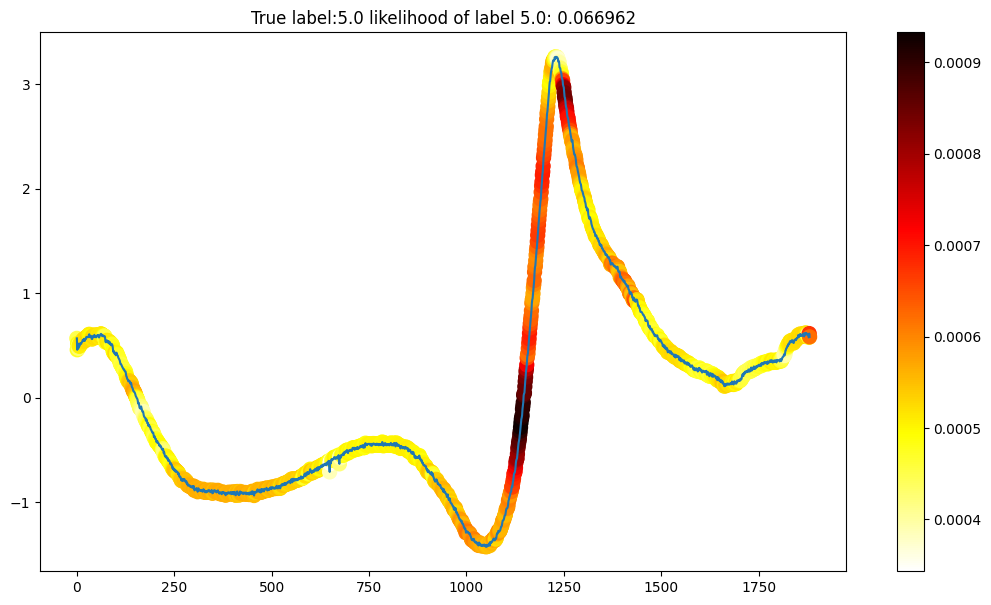

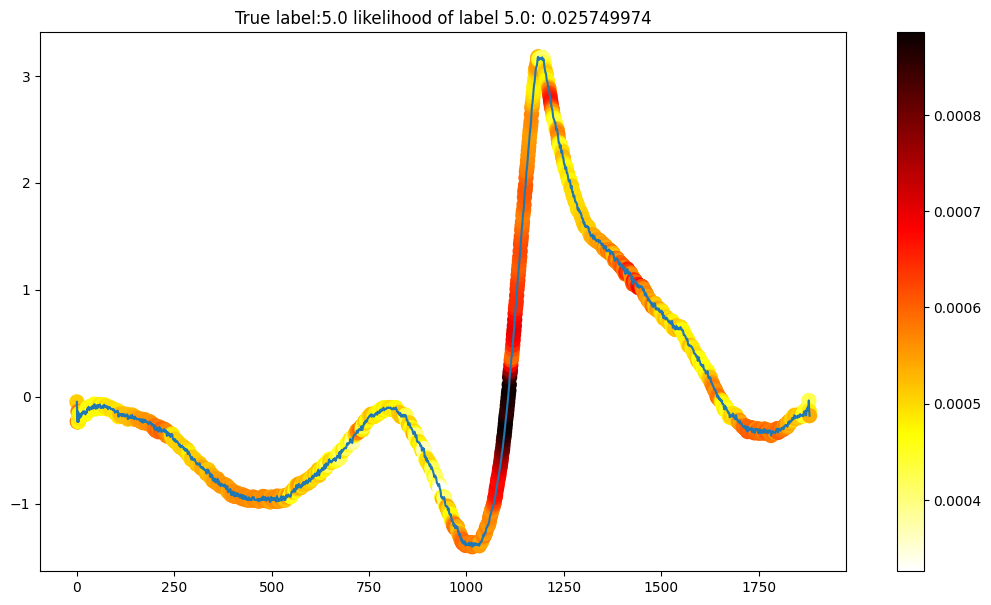

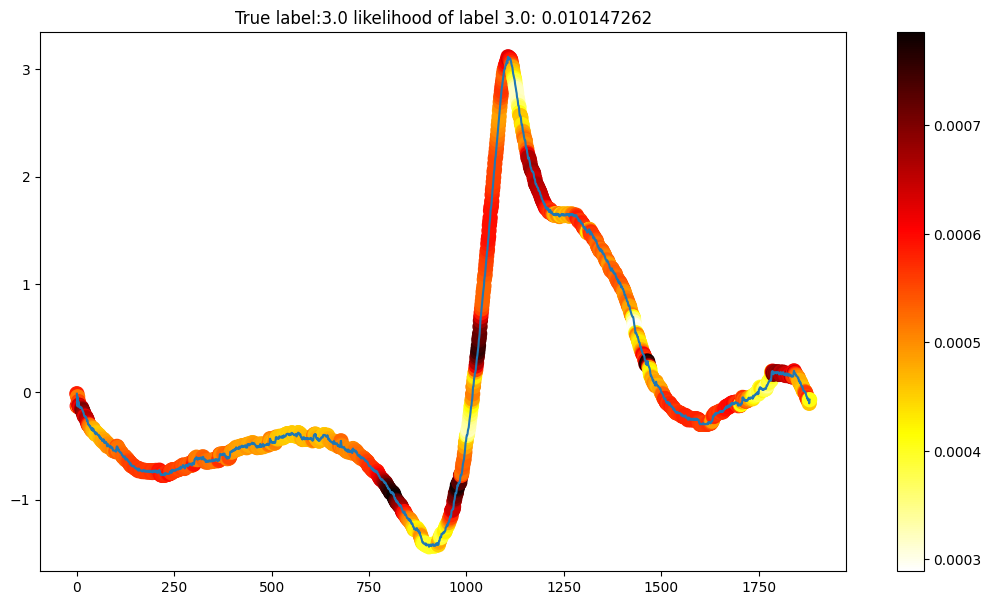

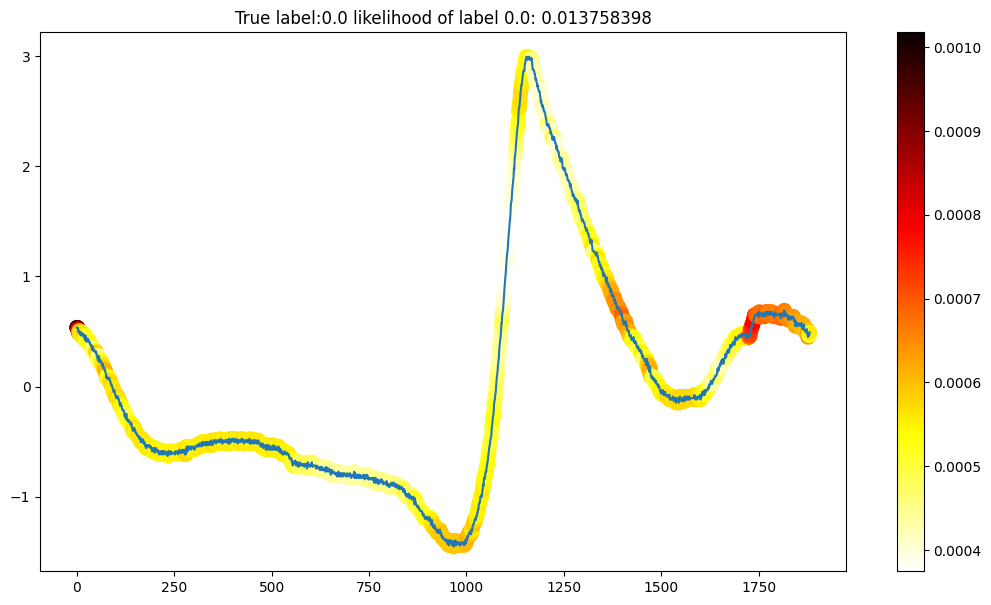

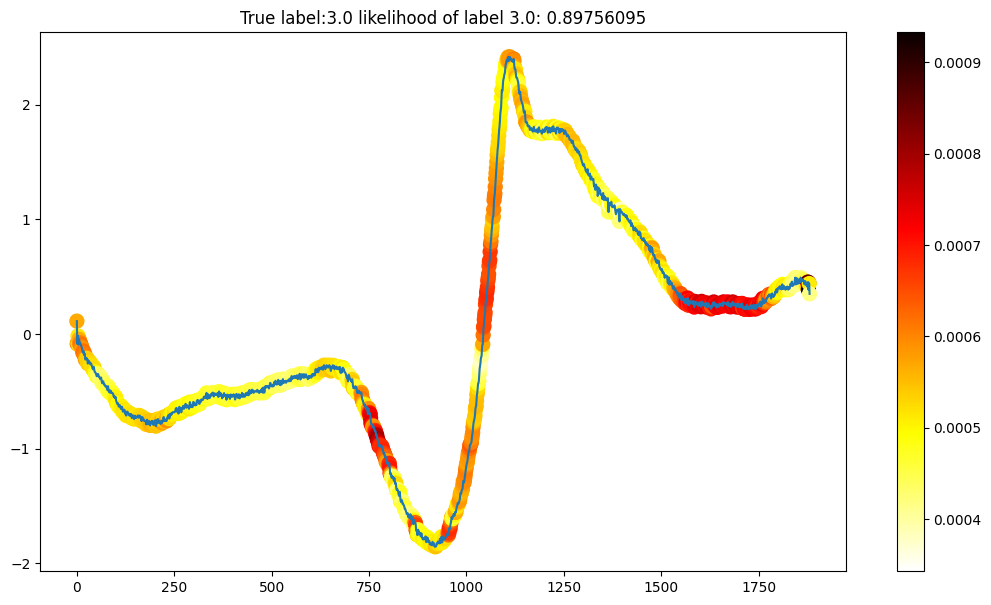

...

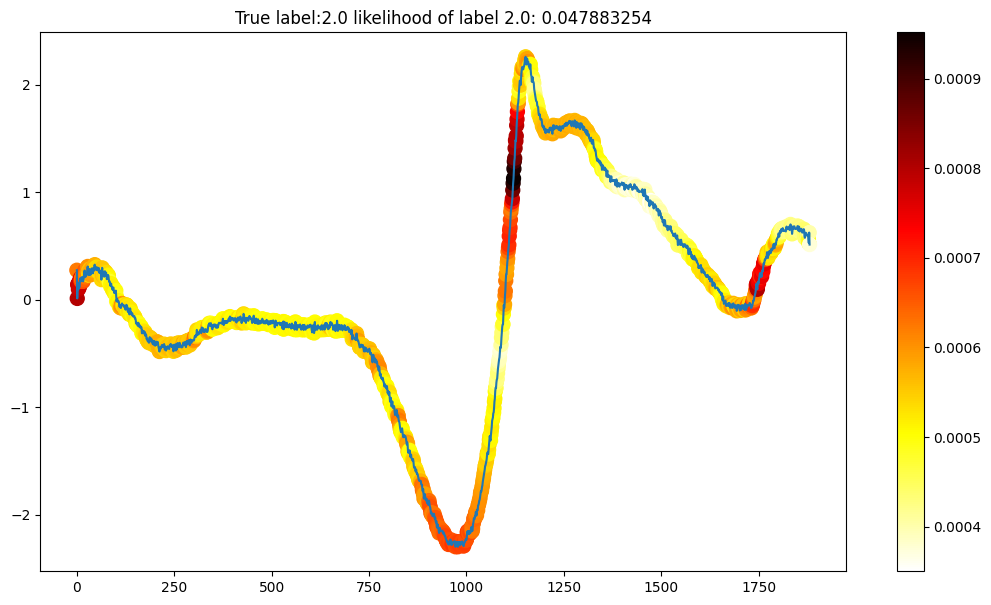

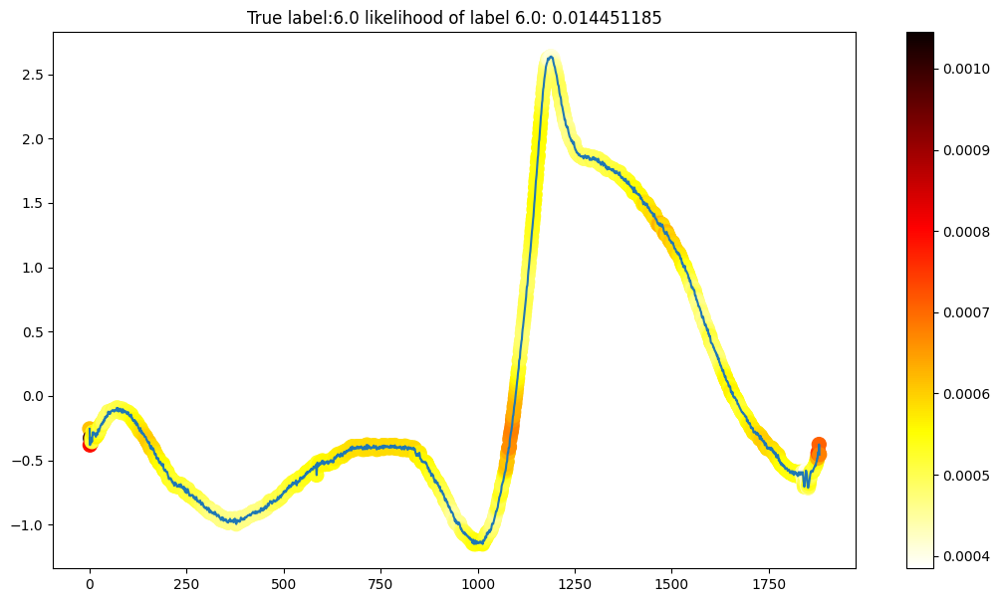

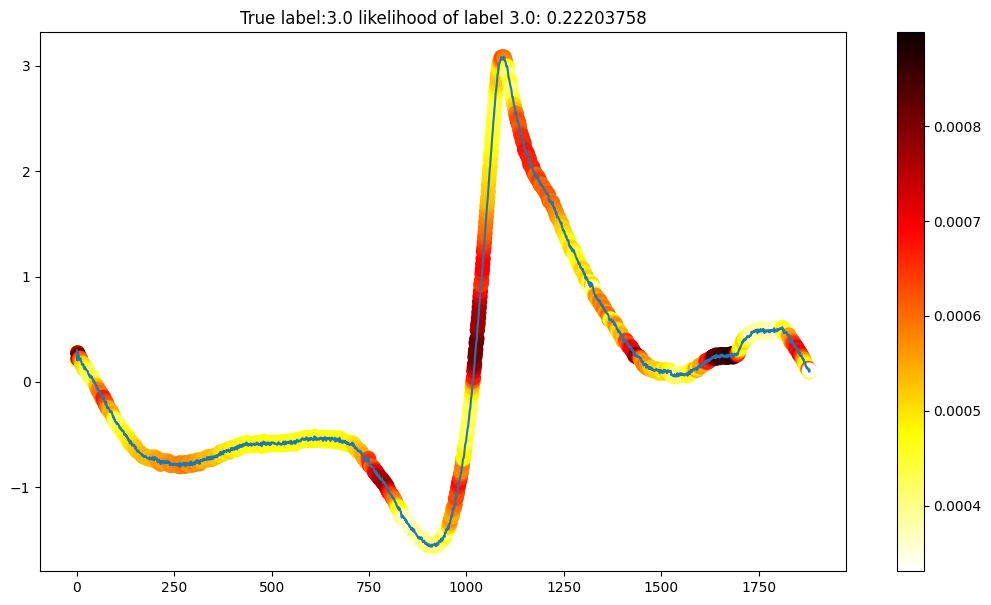

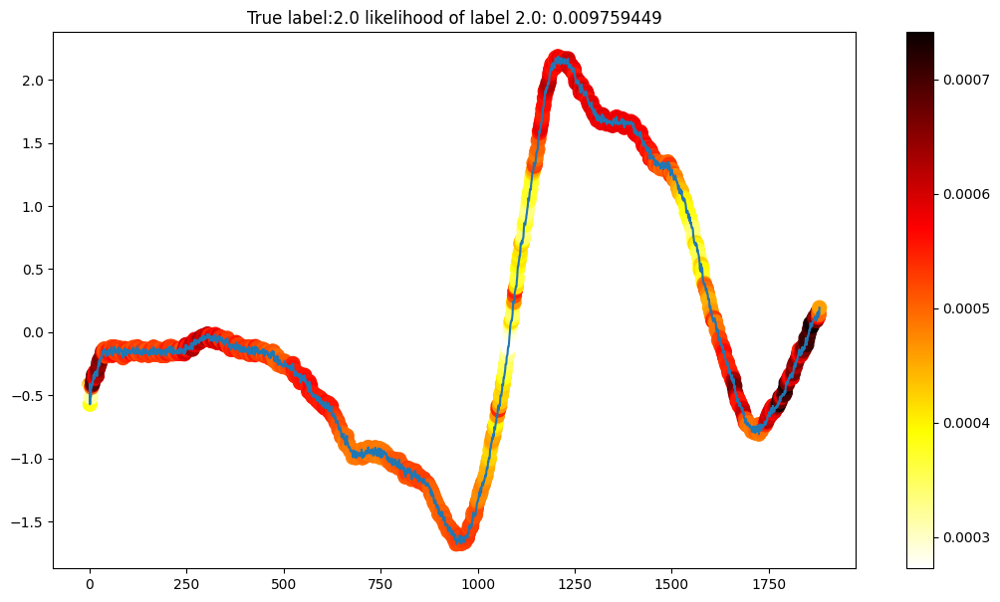

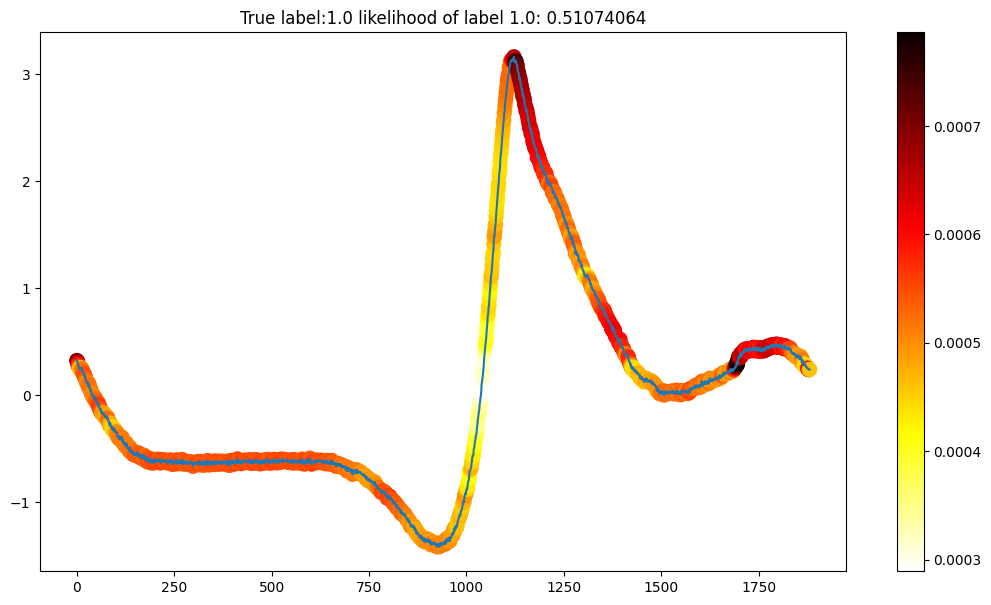

In [ ]:
#!/usr/bin/env python3
"""
Created on Sun Oct 30 20:11:19 2016
@author: stephen
Fixed for modern TensorFlow/Keras (TF2.x)
"""
from tensorflow import keras
from tensorflow.keras.models import Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def readucr(filename):
    data = np.loadtxt(filename + '.txt')
    Y = data[:, 0]
    X = data[:, 1:]
    return X, Y

nb_epochs = 2000
flist = ['InlineSkate']
for each in flist:
    fname = each
    x_train, y_train = readucr(fname + '/' + fname + '_TRAIN')
    x_test, y_test = readucr(fname + '/' + fname + '_TEST')
    nb_classes = len(np.unique(y_test))
    batch_size = min(x_train.shape[0] // 10, 16)

    y_train = (y_train - y_train.min()) / (y_train.max() - y_train.min()) * (nb_classes - 1)
    y_test = (y_test - y_test.min()) / (y_test.max() - y_test.min()) * (nb_classes - 1)

    Y_train = keras.utils.to_categorical(y_train, nb_classes)
    Y_test = keras.utils.to_categorical(y_test, nb_classes)

    x_train_mean = x_train.mean()
    x_train_std = x_train.std()
    x_train = (x_train - x_train_mean) / (x_train_std)

    x_test = (x_test - x_train_mean) / (x_train_std)
    x_train = x_train.reshape(x_train.shape + (1, 1,))
    x_test = x_test.reshape(x_test.shape + (1, 1,))
    x = keras.layers.Input(x_train.shape[1:])
    conv1 = keras.layers.Conv2D(128, 8, 1, padding='same')(x)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.Activation('relu')(conv1)

    conv2 = keras.layers.Conv2D(256, 5, 1, padding='same')(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.Activation('relu')(conv2)

    conv3 = keras.layers.Conv2D(128, 3, 1, padding='same')(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.Activation('relu')(conv3)

    full = keras.layers.GlobalAveragePooling2D()(conv3)
    out = keras.layers.Dense(nb_classes, activation='softmax')(full)

    model = keras.models.Model(inputs=x, outputs=out)

    optimizer = keras.optimizers.Adam()
    model.compile(loss='categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])

    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                                                  patience=50, min_lr=0.0001)
    hist = model.fit(x_train, Y_train, batch_size=batch_size, epochs=nb_epochs,
                     verbose=1, validation_data=(x_test, Y_test), callbacks=[reduce_lr])
    # Print the testing results which has the lowest training loss.
    log = pd.DataFrame(hist.history)
    print(log.loc[log['loss'].idxmin()]['loss'], log.loc[log['loss'].idxmin()]['val_accuracy'])

############## Get CAM ################
# Create submodels for intermediate outputs (replaces deprecated K.function)
last_conv_model = Model(inputs=model.inputs, outputs=model.layers[-3].output)
softmax_model = Model(inputs=model.inputs, outputs=model.layers[-1].output)

# Get outputs in inference mode
last_conv = last_conv_model.predict(x_test[:100])
softmax = softmax_model.predict(x_test[:100])

# Alternatively, to match original learning_phase=1 (training mode):
# last_conv = last_conv_model(x_test[:100], training=True).numpy()
# softmax = softmax_model(x_test[:100], training=True).numpy()

softmax_weight = model.get_weights()[-2]
CAM = np.dot(last_conv, softmax_weight)

for k in range(20):
    CAM_k = (CAM - CAM.min(axis=1, keepdims=True)) / (CAM.max(axis=1, keepdims=True) - CAM.min(axis=1, keepdims=True) + 1e-7)  # Added epsilon for stability
    c = np.exp(CAM_k) / np.sum(np.exp(CAM_k), axis=1, keepdims=True)
    plt.figure(figsize=(13, 7))
    plt.plot(x_test[k].squeeze())
    plt.scatter(np.arange(len(x_test[k])), x_test[k].squeeze(), cmap='hot_r', c=c[k, :, :, int(y_test[k])].squeeze(), s=100)
    plt.title('True label:' + str(y_test[k]) + ' likelihood of label ' + str(y_test[k]) + ': ' + str(softmax[k][int(y_test[k])]))
    plt.colorbar()
    plt.show()  # Use plt.show() instead of saving to PDF for notebook display

# 4) FCN on Coffee dataset

Epoch 1/2000
14/14 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - accuracy: 0.5000 - loss: 0.7362 - val_accuracy: 0.5357 - val_loss: 0.6913 - learning_rate: 0.0010
Epoch 2/2000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5357 - loss: 0.6796 - val_accuracy: 0.5357 - val_loss: 0.6906 - learning_rate: 0.0010
Epoch 3/2000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7143 - loss: 0.6663 - val_accuracy: 0.4643 - val_loss: 0.6947 - learning_rate: 0.0010
Epoch 4/2000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6429 - loss: 0.6754 - val_accuracy: 0.4643 - val_loss: 0.7020 - learning_rate: 0.0010
Epoch 5/2000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6071 - loss: 0.6621 - val_accuracy: 0.4643 - val_loss: 0.7913 - learning_rate: 0.0010
Epoch 6/2000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5714 - loss: 0.6516 - val_accuracy: 0.4643 - val_loss: 0.8288 - learning_rate: 0.0010
Epoch 7/2000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8929 - loss: 0.

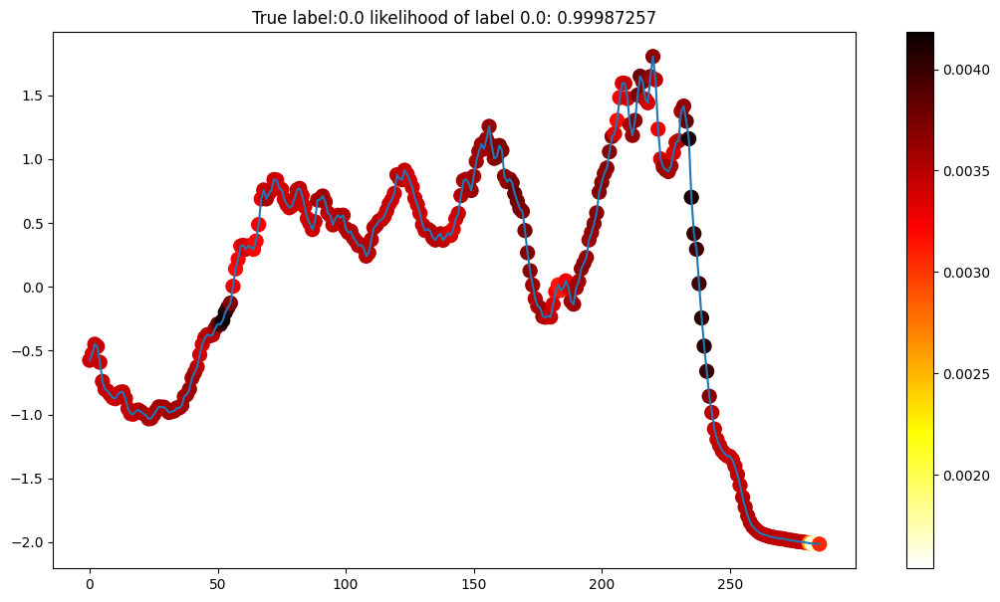

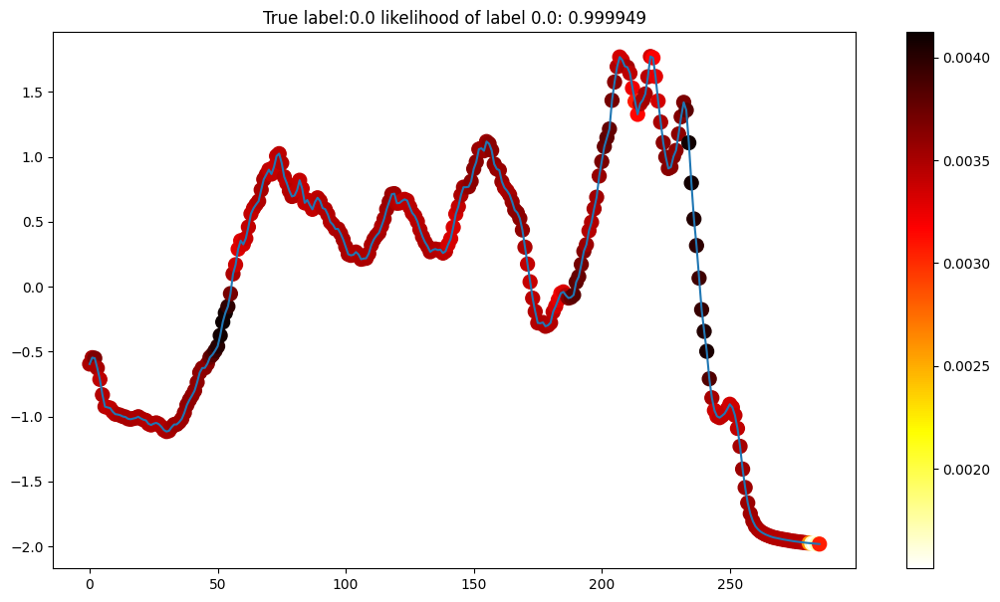

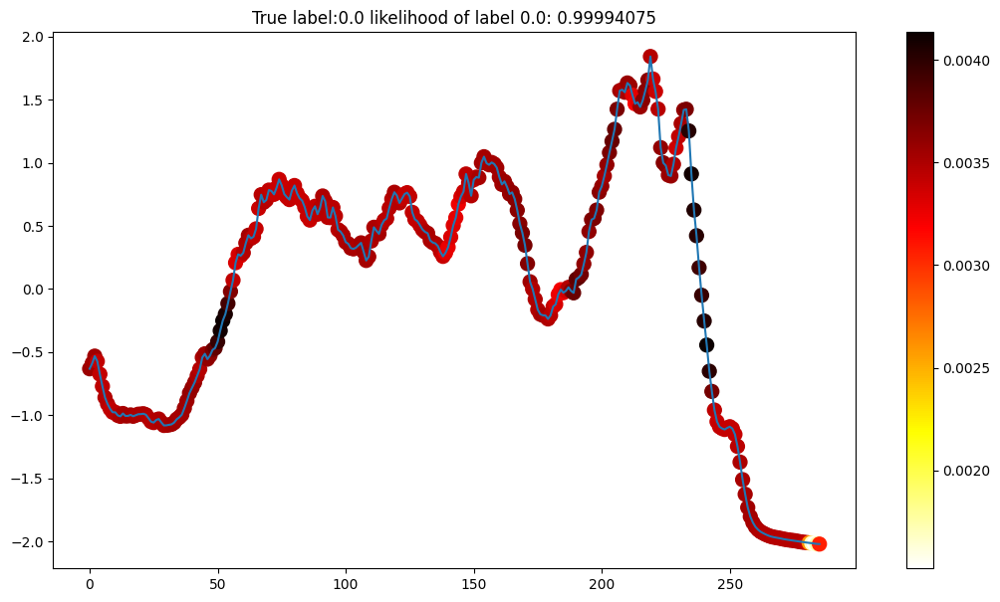

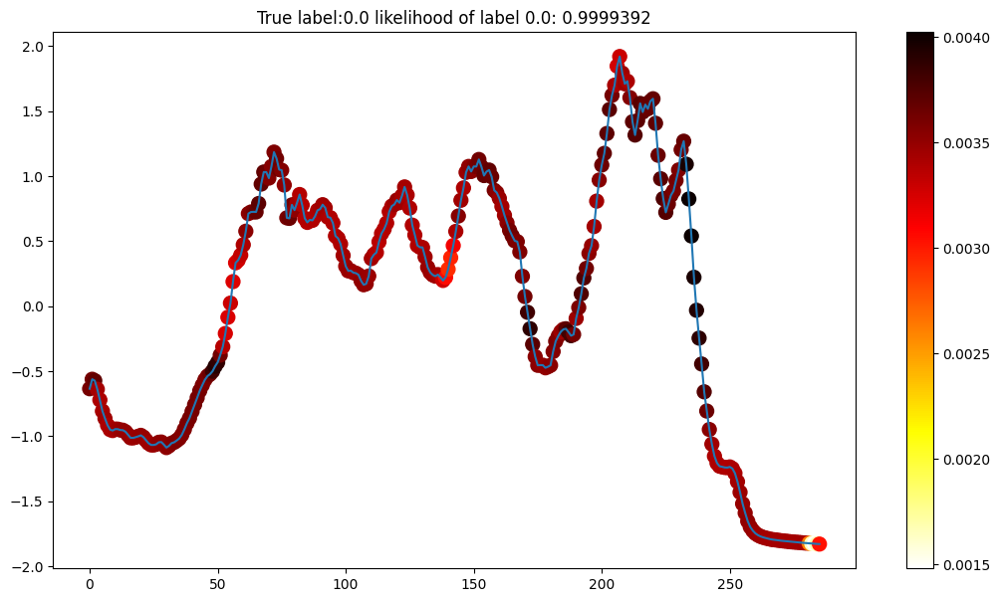

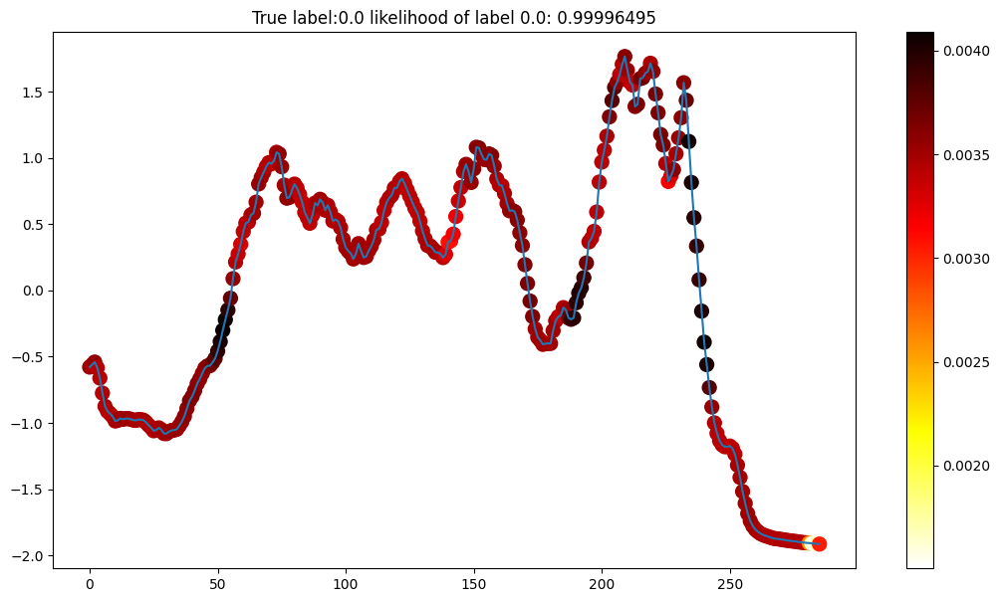

...

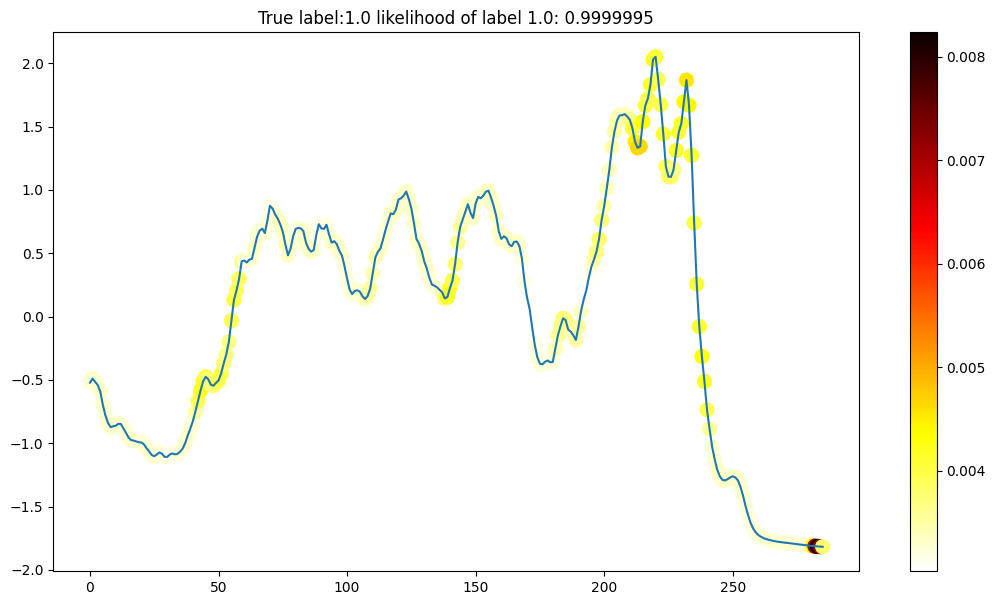

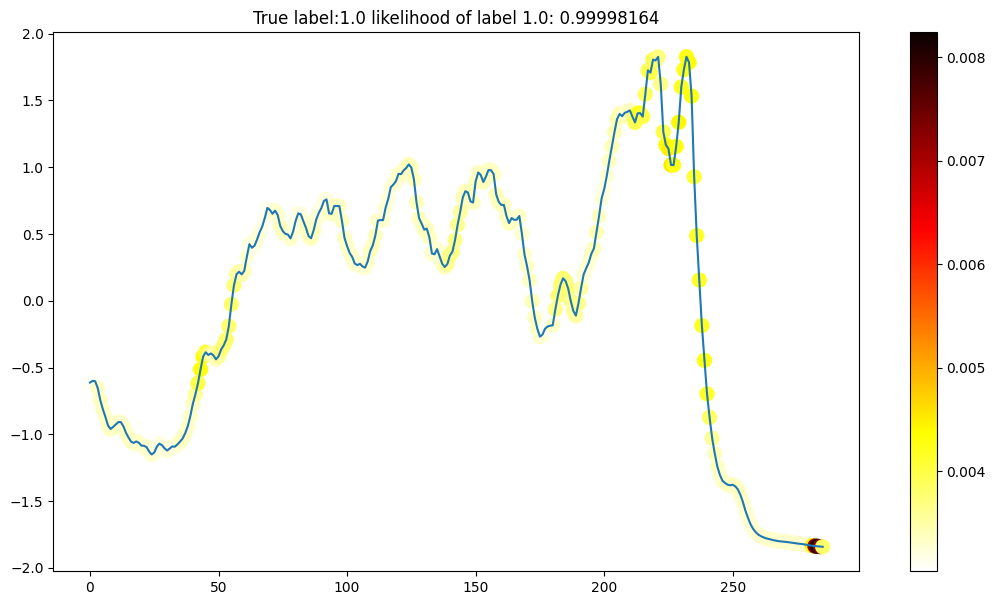

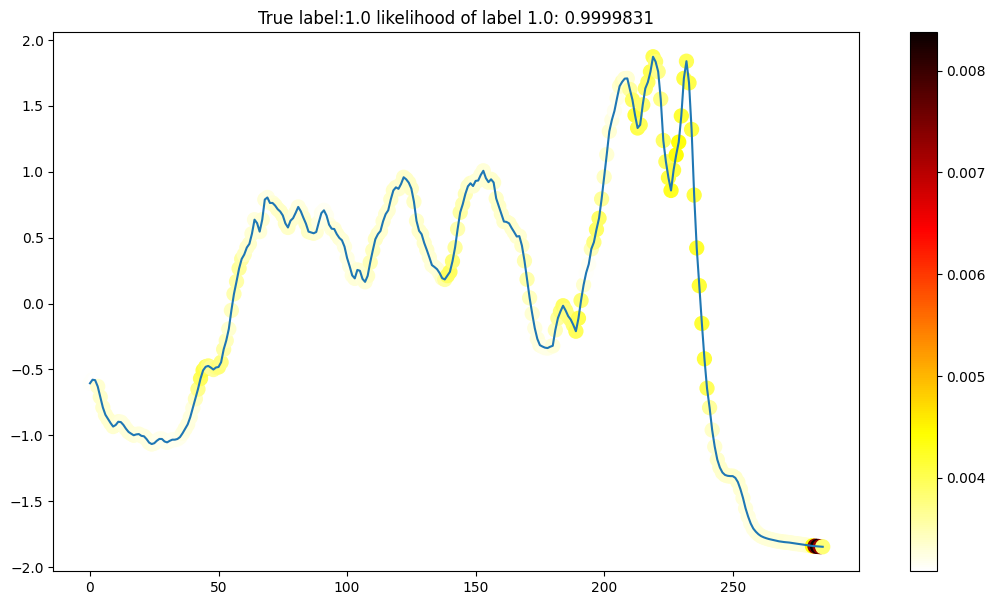

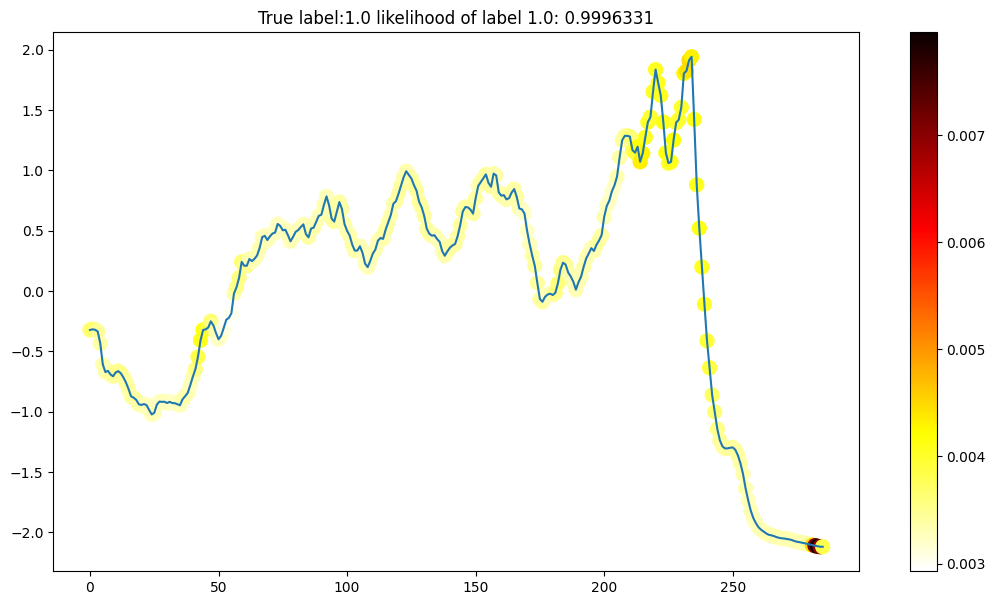

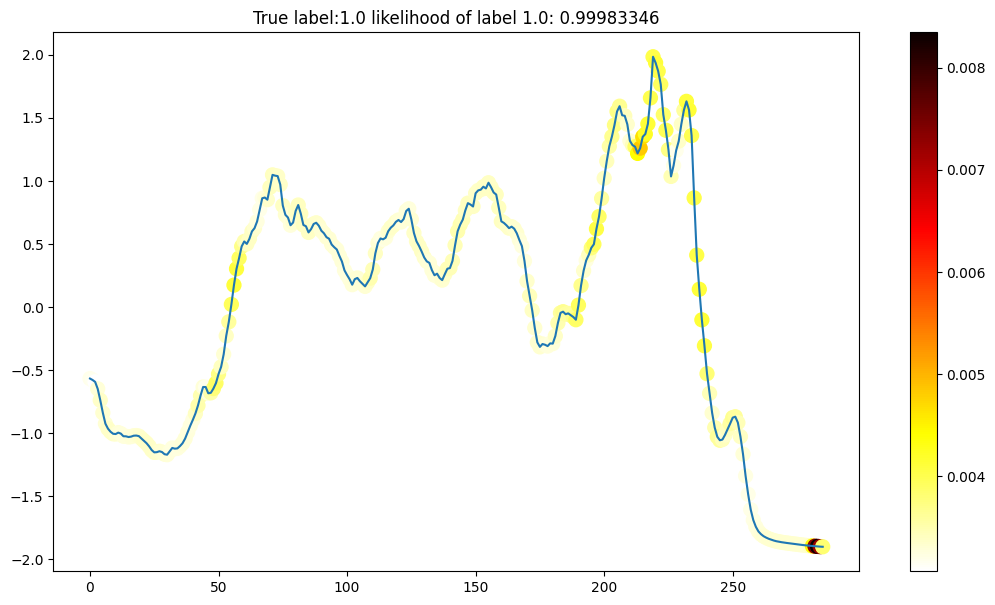

In [1]:
#!/usr/bin/env python3
"""
Created on Sun Oct 30 20:11:19 2016
@author: stephen
Fixed for modern TensorFlow/Keras (TF2.x)
"""
from tensorflow import keras
from tensorflow.keras.models import Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def readucr(filename):
    data = np.loadtxt(filename + '.txt')
    Y = data[:, 0]
    X = data[:, 1:]
    return X, Y

nb_epochs = 2000
flist = ['Coffee']
for each in flist:
    fname = each
    x_train, y_train = readucr(fname + '/' + fname + '_TRAIN')
    x_test, y_test = readucr(fname + '/' + fname + '_TEST')
    nb_classes = len(np.unique(y_test))
    batch_size = min(x_train.shape[0] // 10, 16)

    y_train = (y_train - y_train.min()) / (y_train.max() - y_train.min()) * (nb_classes - 1)
    y_test = (y_test - y_test.min()) / (y_test.max() - y_test.min()) * (nb_classes - 1)

    Y_train = keras.utils.to_categorical(y_train, nb_classes)
    Y_test = keras.utils.to_categorical(y_test, nb_classes)

    x_train_mean = x_train.mean()
    x_train_std = x_train.std()
    x_train = (x_train - x_train_mean) / (x_train_std)

    x_test = (x_test - x_train_mean) / (x_train_std)
    x_train = x_train.reshape(x_train.shape + (1, 1,))
    x_test = x_test.reshape(x_test.shape + (1, 1,))
    x = keras.layers.Input(x_train.shape[1:])
    conv1 = keras.layers.Conv2D(128, 8, 1, padding='same')(x)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.Activation('relu')(conv1)

    conv2 = keras.layers.Conv2D(256, 5, 1, padding='same')(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.Activation('relu')(conv2)

    conv3 = keras.layers.Conv2D(128, 3, 1, padding='same')(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.Activation('relu')(conv3)

    full = keras.layers.GlobalAveragePooling2D()(conv3)
    out = keras.layers.Dense(nb_classes, activation='softmax')(full)

    model = keras.models.Model(inputs=x, outputs=out)

    optimizer = keras.optimizers.Adam()
    model.compile(loss='categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])

    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                                                  patience=50, min_lr=0.0001)
    hist = model.fit(x_train, Y_train, batch_size=batch_size, epochs=nb_epochs,
                     verbose=1, validation_data=(x_test, Y_test), callbacks=[reduce_lr])
    # Print the testing results which has the lowest training loss.
    log = pd.DataFrame(hist.history)
    print(log.loc[log['loss'].idxmin()]['loss'], log.loc[log['loss'].idxmin()]['val_accuracy'])

############## Get CAM ################
# Create submodels for intermediate outputs (replaces deprecated K.function)
last_conv_model = Model(inputs=model.inputs, outputs=model.layers[-3].output)
softmax_model = Model(inputs=model.inputs, outputs=model.layers[-1].output)

# Get outputs in inference mode
last_conv = last_conv_model.predict(x_test[:100])
softmax = softmax_model.predict(x_test[:100])

# Alternatively, to match original learning_phase=1 (training mode):
# last_conv = last_conv_model(x_test[:100], training=True).numpy()
# softmax = softmax_model(x_test[:100], training=True).numpy()

softmax_weight = model.get_weights()[-2]
CAM = np.dot(last_conv, softmax_weight)

for k in range(20):
    CAM_k = (CAM - CAM.min(axis=1, keepdims=True)) / (CAM.max(axis=1, keepdims=True) - CAM.min(axis=1, keepdims=True) + 1e-7)  # Added epsilon for stability
    c = np.exp(CAM_k) / np.sum(np.exp(CAM_k), axis=1, keepdims=True)
    plt.figure(figsize=(13, 7))
    plt.plot(x_test[k].squeeze())
    plt.scatter(np.arange(len(x_test[k])), x_test[k].squeeze(), cmap='hot_r', c=c[k, :, :, int(y_test[k])].squeeze(), s=100)
    plt.title('True label:' + str(y_test[k]) + ' likelihood of label ' + str(y_test[k]) + ': ' + str(softmax[k][int(y_test[k])]))
    plt.colorbar()
    plt.show()  # Use plt.show() instead of saving to PDF for notebook display

# 5) FCN on MedicalImages dataset

Epoch 1/2000
24/24 ━━━━━━━━━━━━━━━━━━━━ 14s 337ms/step - accuracy: 0.4383 - loss: 1.7661 - val_accuracy: 0.5145 - val_loss: 2.1064 - learning_rate: 0.0010
Epoch 2/2000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5512 - loss: 1.3422 - val_accuracy: 0.5145 - val_loss: 1.8577 - learning_rate: 0.0010
Epoch 3/2000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5696 - loss: 1.2635 - val_accuracy: 0.5145 - val_loss: 1.7780 - learning_rate: 0.0010
Epoch 4/2000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5538 - loss: 1.1999 - val_accuracy: 0.5145 - val_loss: 1.9192 - learning_rate: 0.0010
Epoch 5/2000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5774 - loss: 1.1278 - val_accuracy: 0.5145 - val_loss: 2.1364 - learning_rate: 0.0010
Epoch 6/2000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6010 - loss: 1.0774 - val_accuracy: 0.5145 - val_loss: 2.4090 - learning_rate: 0.0010
Epoch 7/2000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6115 - loss: 

1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 465ms/step

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step


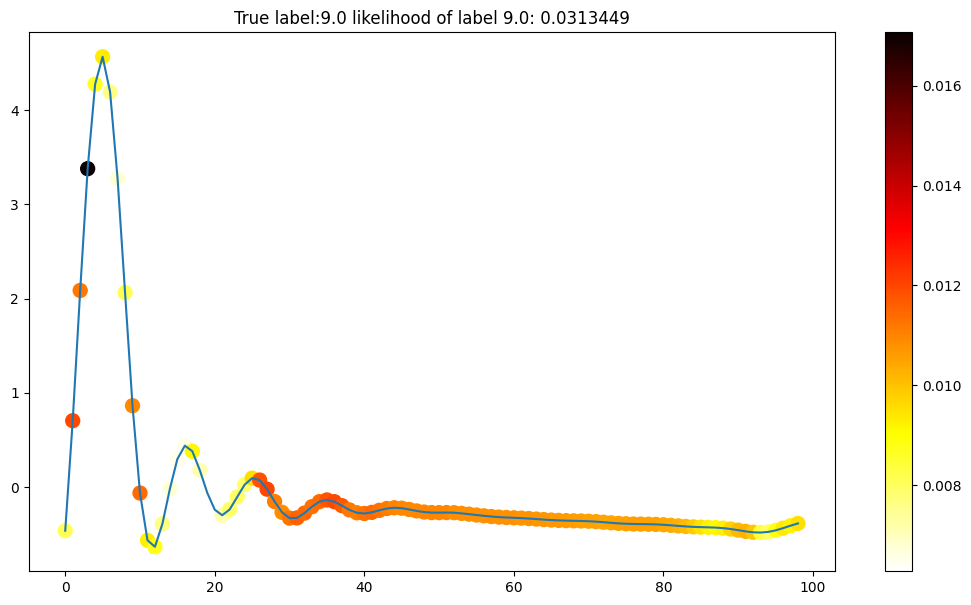

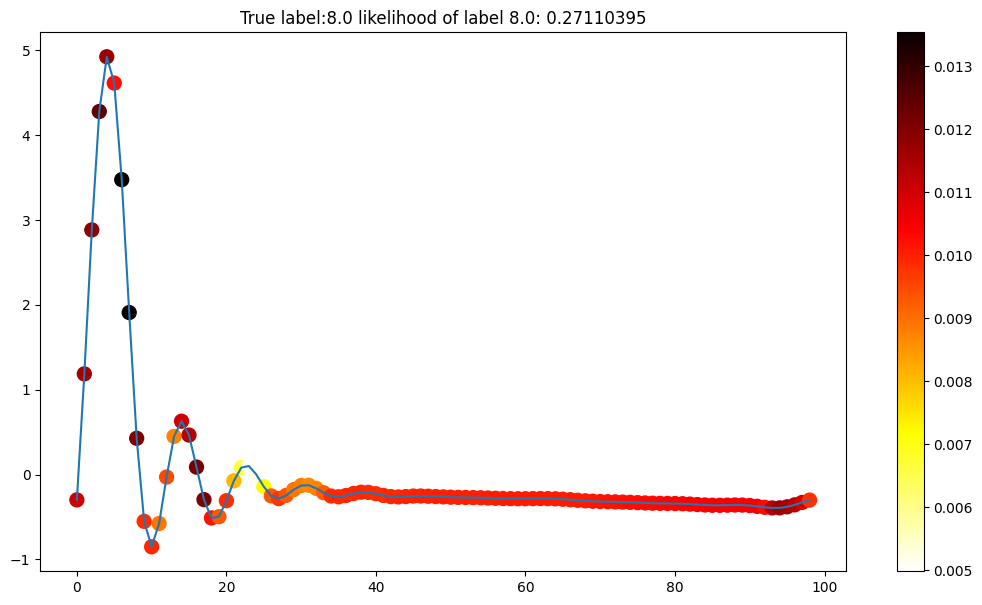

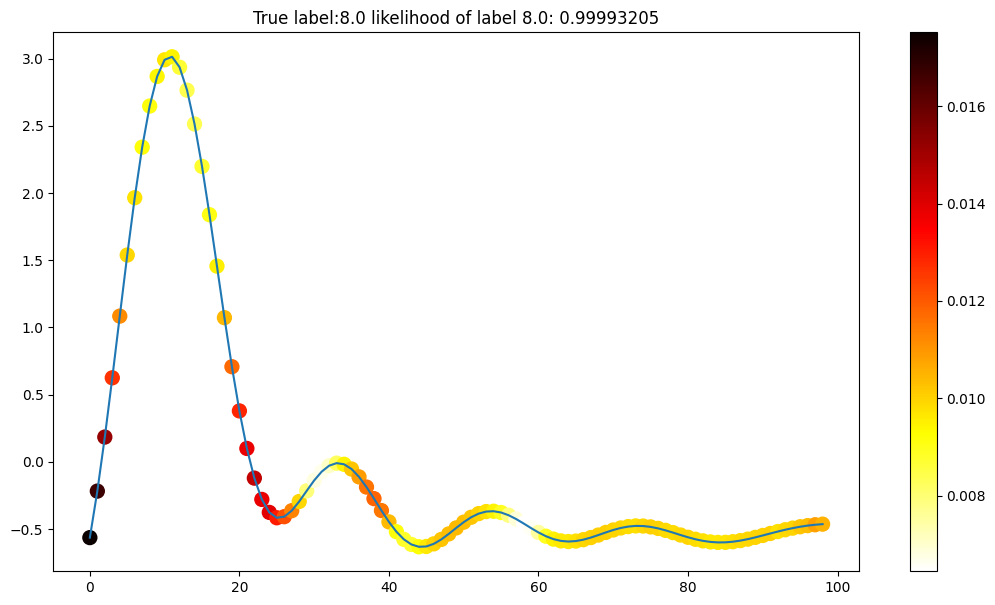

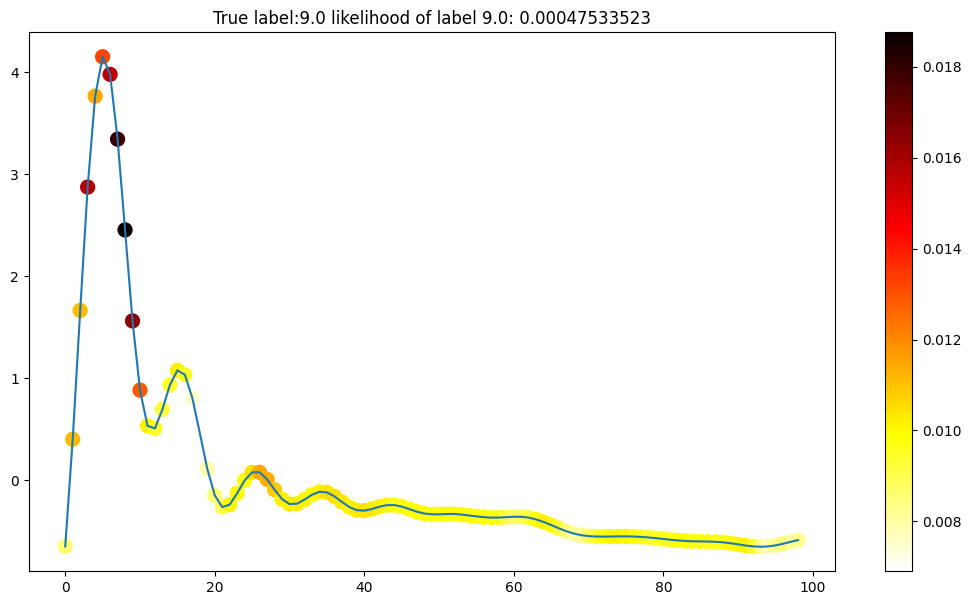

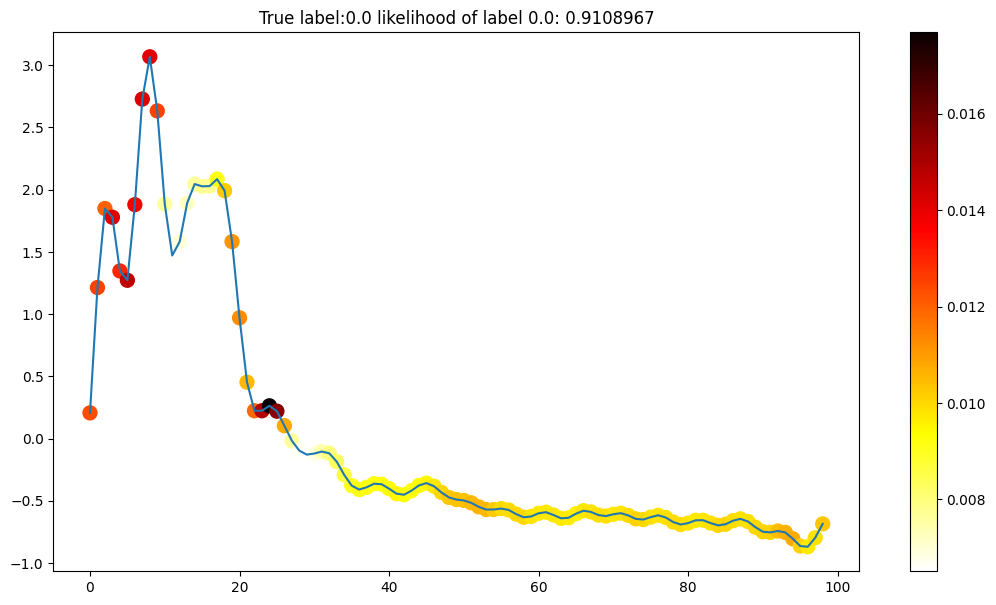

...

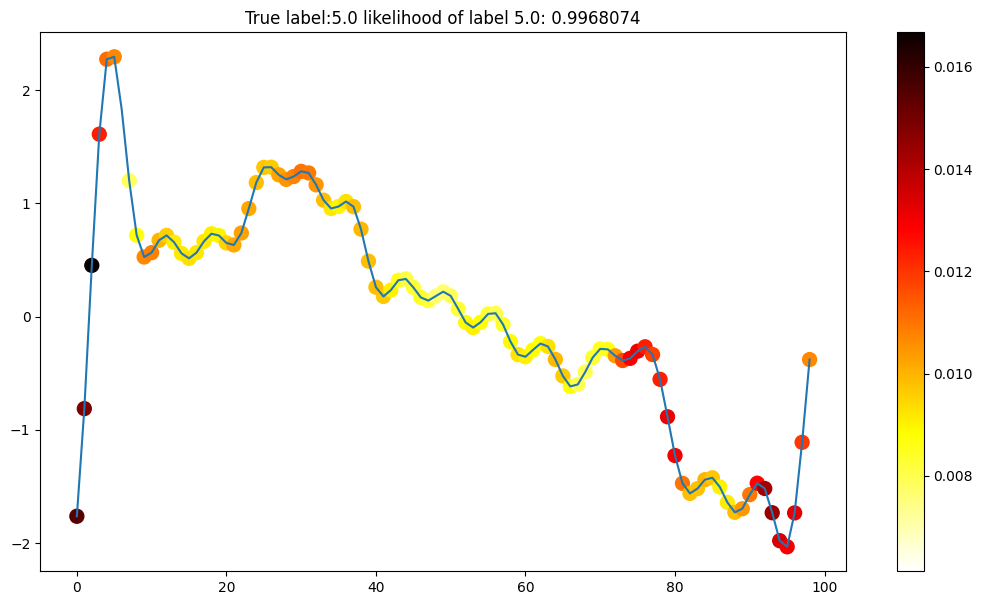

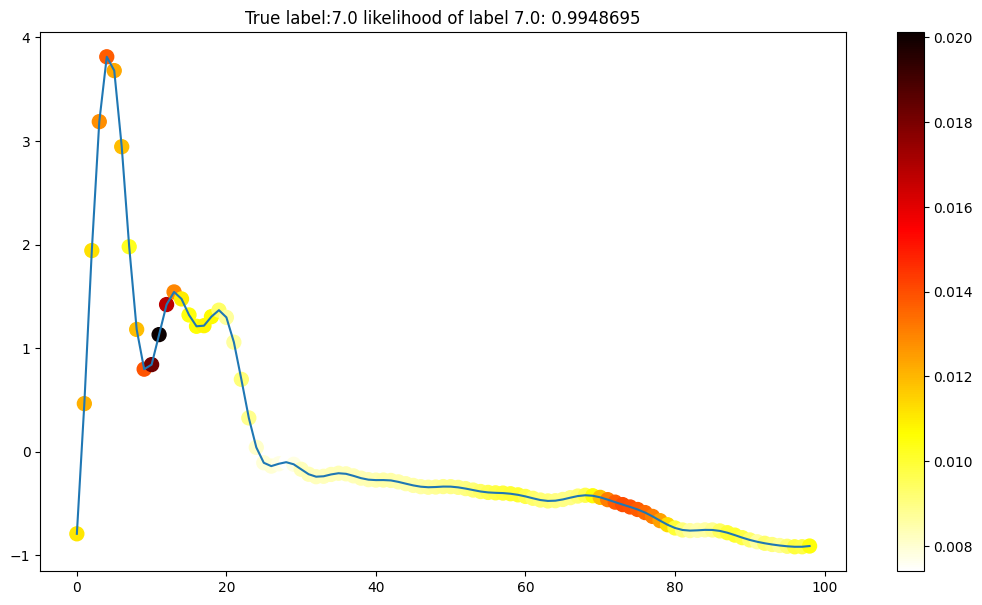

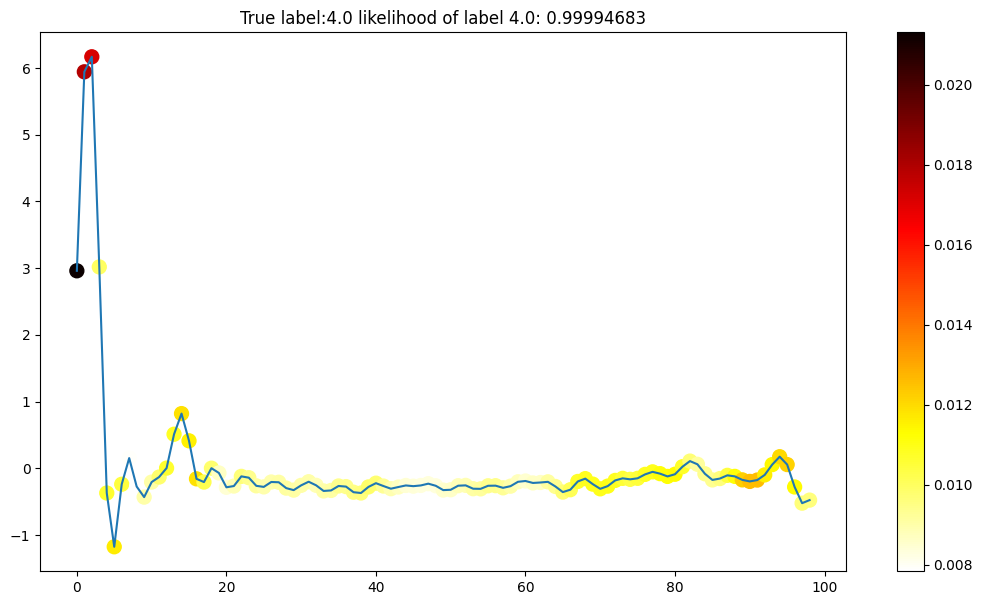

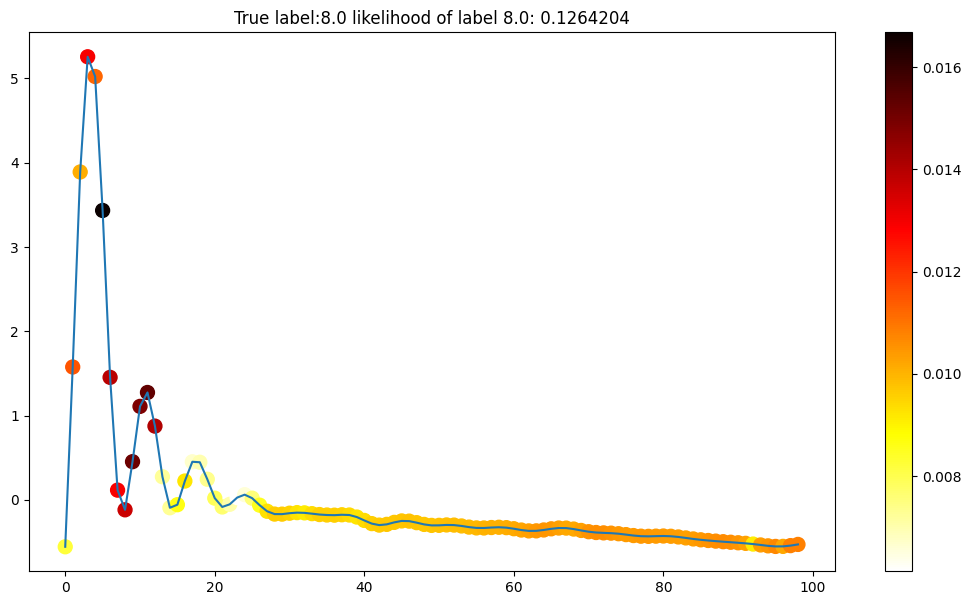

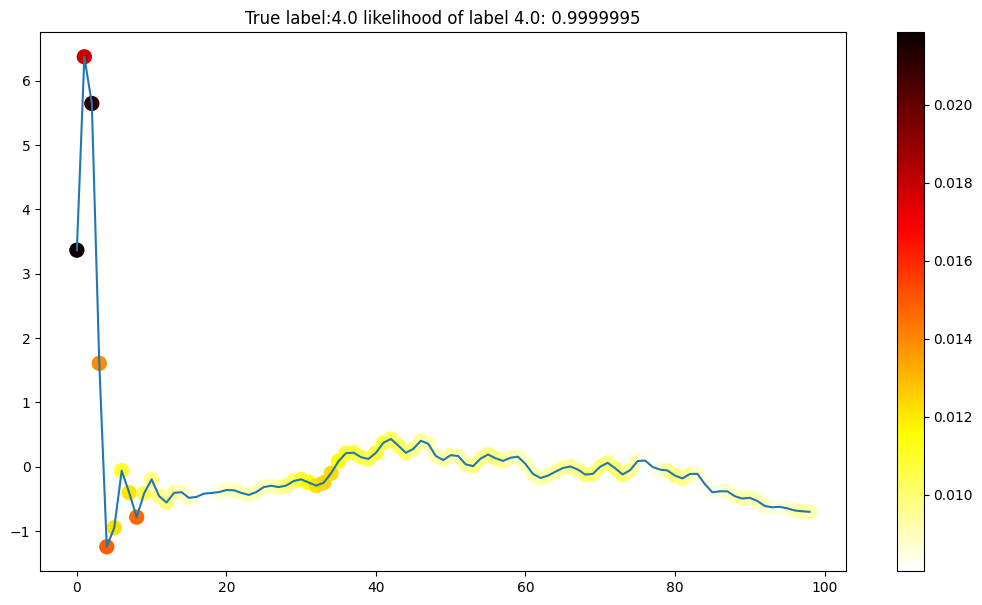

In [2]:
#!/usr/bin/env python3
"""
Created on Sun Oct 30 20:11:19 2016
@author: stephen
Fixed for modern TensorFlow/Keras (TF2.x)
"""
from tensorflow import keras
from tensorflow.keras.models import Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def readucr(filename):
    data = np.loadtxt(filename + '.txt')
    Y = data[:, 0]
    X = data[:, 1:]
    return X, Y

nb_epochs = 2000
flist = ['MedicalImages']
for each in flist:
    fname = each
    x_train, y_train = readucr(fname + '/' + fname + '_TRAIN')
    x_test, y_test = readucr(fname + '/' + fname + '_TEST')
    nb_classes = len(np.unique(y_test))
    batch_size = min(x_train.shape[0] // 10, 16)

    y_train = (y_train - y_train.min()) / (y_train.max() - y_train.min()) * (nb_classes - 1)
    y_test = (y_test - y_test.min()) / (y_test.max() - y_test.min()) * (nb_classes - 1)

    Y_train = keras.utils.to_categorical(y_train, nb_classes)
    Y_test = keras.utils.to_categorical(y_test, nb_classes)

    x_train_mean = x_train.mean()
    x_train_std = x_train.std()
    x_train = (x_train - x_train_mean) / (x_train_std)

    x_test = (x_test - x_train_mean) / (x_train_std)
    x_train = x_train.reshape(x_train.shape + (1, 1,))
    x_test = x_test.reshape(x_test.shape + (1, 1,))
    x = keras.layers.Input(x_train.shape[1:])
    conv1 = keras.layers.Conv2D(128, 8, 1, padding='same')(x)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.Activation('relu')(conv1)

    conv2 = keras.layers.Conv2D(256, 5, 1, padding='same')(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.Activation('relu')(conv2)

    conv3 = keras.layers.Conv2D(128, 3, 1, padding='same')(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.Activation('relu')(conv3)

    full = keras.layers.GlobalAveragePooling2D()(conv3)
    out = keras.layers.Dense(nb_classes, activation='softmax')(full)

    model = keras.models.Model(inputs=x, outputs=out)

    optimizer = keras.optimizers.Adam()
    model.compile(loss='categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])

    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                                                  patience=50, min_lr=0.0001)
    hist = model.fit(x_train, Y_train, batch_size=batch_size, epochs=nb_epochs,
                     verbose=1, validation_data=(x_test, Y_test), callbacks=[reduce_lr])
    # Print the testing results which has the lowest training loss.
    log = pd.DataFrame(hist.history)
    print(log.loc[log['loss'].idxmin()]['loss'], log.loc[log['loss'].idxmin()]['val_accuracy'])

############## Get CAM ################
# Create submodels for intermediate outputs (replaces deprecated K.function)
last_conv_model = Model(inputs=model.inputs, outputs=model.layers[-3].output)
softmax_model = Model(inputs=model.inputs, outputs=model.layers[-1].output)

# Get outputs in inference mode
last_conv = last_conv_model.predict(x_test[:100])
softmax = softmax_model.predict(x_test[:100])

# Alternatively, to match original learning_phase=1 (training mode):
# last_conv = last_conv_model(x_test[:100], training=True).numpy()
# softmax = softmax_model(x_test[:100], training=True).numpy()

softmax_weight = model.get_weights()[-2]
CAM = np.dot(last_conv, softmax_weight)

for k in range(20):
    CAM_k = (CAM - CAM.min(axis=1, keepdims=True)) / (CAM.max(axis=1, keepdims=True) - CAM.min(axis=1, keepdims=True) + 1e-7)  # Added epsilon for stability
    c = np.exp(CAM_k) / np.sum(np.exp(CAM_k), axis=1, keepdims=True)
    plt.figure(figsize=(13, 7))
    plt.plot(x_test[k].squeeze())
    plt.scatter(np.arange(len(x_test[k])), x_test[k].squeeze(), cmap='hot_r', c=c[k, :, :, int(y_test[k])].squeeze(), s=100)
    plt.title('True label:' + str(y_test[k]) + ' likelihood of label ' + str(y_test[k]) + ': ' + str(softmax[k][int(y_test[k])]))
    plt.colorbar()
    plt.show()  # Use plt.show() instead of saving to PDF for notebook display